<h6><center></center></h6>

<h1>
<hr style=" border:none; height:3px;">
<center>Explainable AI Project - Explaining the effect of online product description on its sales and success</center>
<hr style=" border:none; height:3px;">
</h1>

<h4>
<center>Authors: Jonathan ELMALEM, Marco FARFAN </center>
</h4>

The project focuses on analyzing what can influence sales and success of a product online. To do so, we have employed several ensemble learning algorithms along with various explainable techniques. It uses a dataset from eCommerce website Wish describing product listings and combines it with their sales performance. It can be used to analyze what increases sales level (like perceptions of price drops or high ratings given by many users) and predicting expected sales performance and success based on a given listing.

https://www.kaggle.com/jmmvutu/summer-products-and-sales-in-ecommerce-wish?select=summer-products-with-rating-and-performance_2020-08.csv

# 1. EDA

### Packages Importation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as pl
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import MaxNLocator
import seaborn as sns

### Data Path

In [2]:
df = pd.read_csv("./summer-products-with-rating-and-performance_2020-08.csv")

### Data Overview

In [3]:
df.head()

,title,title_orig,price,retail_price,currency_buyer,units_sold,uses_ad_boosts,rating,rating_count,rating_five_count,...,merchant_rating_count,merchant_rating,merchant_id,merchant_has_profile_picture,merchant_profile_picture,product_url,product_picture,product_id,theme,crawl_month
0,2020 Summer Vintage Flamingo Print Pajamas Se...,2020 Summer Vintage Flamingo Print Pajamas Se...,16.00,14,EUR,100,0,3.76,54,26.0,...,568,4.128521,595097d6a26f6e070cb878d1,0,NaN,https://www.wish.com/c/5e9ae51d43d6a96e303acdb0,https://contestimg.wish.com/api/webimage/5e9ae...,5e9ae51d43d6a96e303acdb0,summer,2020-08
1,SSHOUSE Summer Casual Sleeveless Soirée Party ...,Women's Casual Summer Sleeveless Sexy Mini Dress,8.00,22,EUR,20000,1,3.45,6135,2269.0,...,17752,3.899673,56458aa03a698c35c9050988,0,NaN,https://www.wish.com/c/58940d436a0d3d5da4e95a38,https://contestimg.wish.com/api/webimage/58940...,58940d436a0d3d5da4e95a38,summer,2020-08
2,2020 Nouvelle Arrivée Femmes Printemps et Été ...,2020 New Arrival Women Spring and Summer Beach...,8.00,43,EUR,100,0,3.57,14,5.0,...,295,3.989831,5d464a1ffdf7bc44ee933c65,0,NaN,https://www.wish.com/c/5ea10e2c617580260d55310a,https://contestimg.wish.com/api/webimage/5ea10...,5ea10e2c617580260d55310a,summer,2020-08
3,Hot Summer Cool T-shirt pour les femmes Mode T...,Hot Summer Cool T Shirt for Women Fashion Tops...,8.00,8,EUR,5000,1,4.03,579,295.0,...,23832,4.020435,58cfdefdacb37b556efdff7c,0,NaN,https://www.wish.com/c/5cedf17ad1d44c52c59e4aca,https://contestimg.wish.com/api/webimage/5cedf...,5cedf17ad1d44c52c59e4aca,summer,2020-08
4,Femmes Shorts d'été à lacets taille élastique ...,Women Summer Shorts Lace Up Elastic Waistband ...,2.72,3,EUR,100,1,3.10,20,6.0,...,14482,4.001588,5ab3b592c3911a095ad5dadb,0,NaN,https://www.wish.com/c/5ebf5819ebac372b070b0e70,https://contestimg.wish.com/api/webimage/5ebf5...,5ebf5819ebac372b070b0e70,summer,2020-08


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1573 entries, 0 to 1572
Data columns (total 43 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   title                         1573 non-null   object 
 1   title_orig                    1573 non-null   object 
 2   price                         1573 non-null   float64
 3   retail_price                  1573 non-null   int64  
 4   currency_buyer                1573 non-null   object 
 5   units_sold                    1573 non-null   int64  
 6   uses_ad_boosts                1573 non-null   int64  
 7   rating                        1573 non-null   float64
 8   rating_count                  1573 non-null   int64  
 9   rating_five_count             1528 non-null   float64
 10  rating_four_count             1528 non-null   float64
 11  rating_three_count            1528 non-null   float64
 12  rating_two_count              1528 non-null   float64
 13  rat

### Columns Informations

1. title : Title for localized for european countries. May be the same as title_orig if the seller did not offer a translation.

2. title_orig : Original english title of the product.

3. price : price for the buyer

4. retail_price : Retail price, or reference price in other stores/places. Used by the seller to indicate a regular value or the price before discount.

5. currency_buyer : currency of the prices

6. units_sold : Number of units sold. Lower bound approximation by steps

7. uses_ad_boosts : Whether the seller paid to boost his product within the platform (highlighting, better placement or whatever).

8. rating : Mean product rating.

9. rating_count : Total number of ratings of the product

10. rating_five_count  : Number of 5-star ratings (there are also similar rating columns for four, three .. stars)

11. badges_count : Number of badges the product or the seller have.

12. badge_local_product : A badge that denotes the product is a local product. Conditions may vary (being produced locally, or something else).  Some people may prefer buying local products rather than. 1 means Yes, has the badge. 

13. badge_product_quality : Badge awarded when many buyers consistently gave good evaluations 1 means Yes, has the badge

14. badge_fast_shipping : Badge awarded when this product's order is consistently shipped rapidly

15. tags : tags set by the seller

16. product_color : Product's main color

17. product_variation_size_id : One of the available size variation for this product

18. product_variation_inventory : Inventory the seller has. Max allowed quantity is 50

19. shipping_option_price : shipping price

20. shipping_is_express : whether the shipping is express or not. 1 for True

21. countries_shipped_to : Number of countries this product is shipped to. Sellers may choose to limit where they ship a product to

22. inventory_total : Total inventory for all the product's variations (size/color variations for instance)

23. has_urgency_banner : whether there was an urgency banner with an urgency

24. merchant_rating : merchant's rating

*Note: Not all the columns are present in the above description.*

#### How is my dataframe in term of general formation ?

In [5]:
df.describe()

,price,retail_price,units_sold,uses_ad_boosts,rating,rating_count,rating_five_count,rating_four_count,rating_three_count,rating_two_count,...,badge_fast_shipping,product_variation_inventory,shipping_option_price,shipping_is_express,countries_shipped_to,inventory_total,has_urgency_banner,merchant_rating_count,merchant_rating,merchant_has_profile_picture
count,1573.000000,1573.000000,1573.000000,1573.000000,1573.000000,1573.000000,1528.000000,1528.000000,1528.000000,1528.000000,...,1573.000000,1573.000000,1573.000000,1573.000000,1573.000000,1573.000000,473.0,1.573000e+03,1573.000000,1573.000000
mean,8.325372,23.288620,4339.005086,0.432931,3.820896,889.659250,442.263743,179.599476,134.549738,63.711387,...,0.012715,33.081373,2.345200,0.002543,40.456453,49.821360,1.0,2.649583e+04,4.032345,0.143675
std,3.932030,30.357863,9356.539302,0.495639,0.515374,1983.928834,980.203270,400.516231,311.690656,151.343933,...,0.112075,21.353137,1.024371,0.050379,20.301203,2.562799,0.0,7.847446e+04,0.204768,0.350871
min,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,1.000000,0.000000,6.000000,1.000000,1.0,0.000000e+00,2.333333,0.000000
25%,5.810000,7.000000,100.000000,0.000000,3.550000,24.000000,12.000000,5.000000,4.000000,2.000000,...,0.000000,6.000000,2.000000,0.000000,31.000000,50.000000,1.0,1.987000e+03,3.917353,0.000000
50%,8.000000,10.000000,1000.000000,0.000000,3.850000,150.000000,79.000000,31.500000,24.000000,11.000000,...,0.000000,50.000000,2.000000,0.000000,40.000000,50.000000,1.0,7.936000e+03,4.040650,0.000000
75%,11.000000,26.000000,5000.000000,1.000000,4.110000,855.000000,413.500000,168.250000,129.250000,62.000000,...,0.000000,50.000000,3.000000,0.000000,43.000000,50.000000,1.0,2.456400e+04,4.161797,0.000000
max,49.000000,252.000000,100000.000000,1.000000,5.000000,20744.000000,11548.000000,4152.000000,3658.000000,2003.000000,...,1.000000,50.000000,12.000000,1.000000,140.000000,50.000000,1.0,2.174765e+06,5.000000,1.000000


#### How many null values I have in each column ?

In [6]:
df.isna().sum()

title                              0
title_orig                         0
price                              0
retail_price                       0
currency_buyer                     0
units_sold                         0
uses_ad_boosts                     0
rating                             0
rating_count                       0
rating_five_count                 45
rating_four_count                 45
rating_three_count                45
rating_two_count                  45
rating_one_count                  45
badges_count                       0
badge_local_product                0
badge_product_quality              0
badge_fast_shipping                0
tags                               0
product_color                     41
product_variation_size_id         14
product_variation_inventory        0
shipping_option_name               0
shipping_option_price              0
shipping_is_express                0
countries_shipped_to               0
inventory_total                    0
h

#### How is the distribution of the  numerical columns ?

<ipython-input-7-79d59cfc256a>:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  df.hist(ax = ax)


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000173A96863A0>,
      dtype=object)

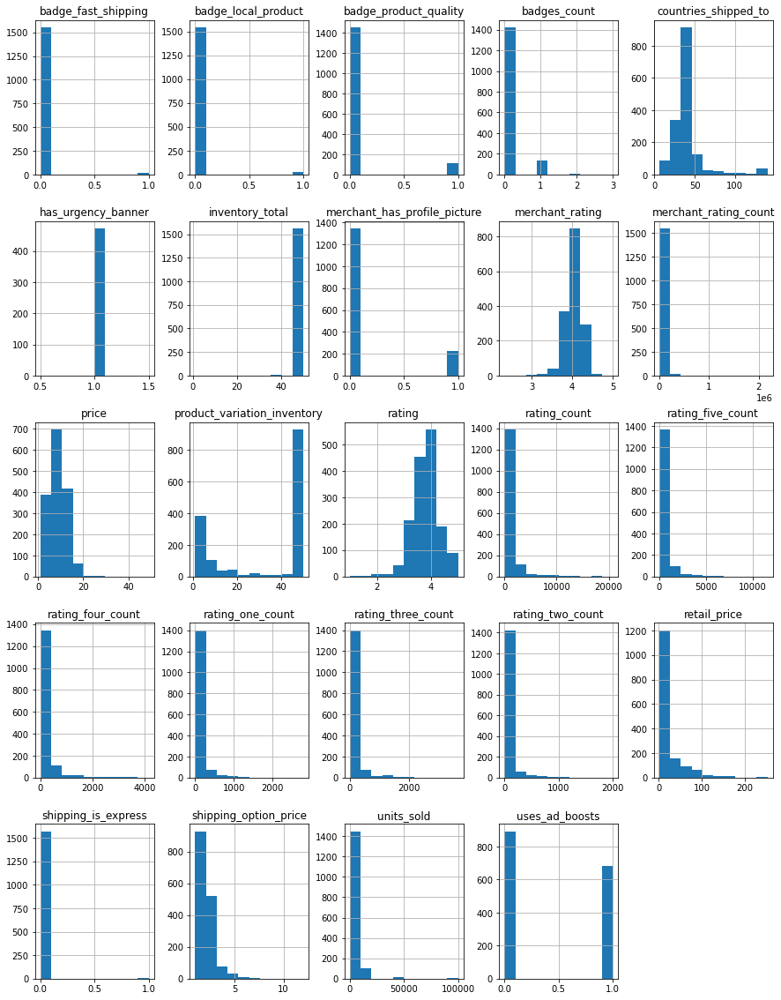

In [7]:
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
df.hist(ax = ax)

#### How my numerical columns are correlated with the target column ?

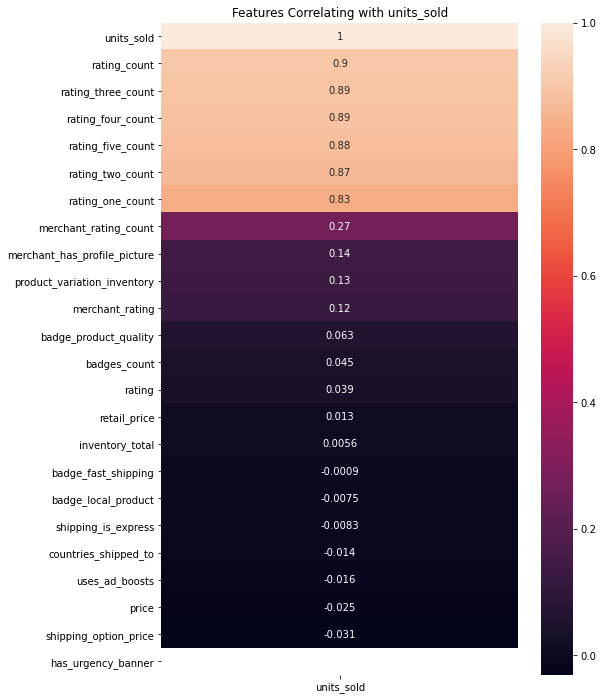

In [8]:
target = 'units_sold'

plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(df.corr()[[target]].sort_values(by=target, ascending=False),annot=True)
heatmap.set_title(f'Features Correlating with {target}');

# 2. Data Preparation

### Unique Values

Let's analyze the number of unique values per columns 

In [9]:
df.nunique()

title                           1201
title_orig                      1203
price                            127
retail_price                     104
currency_buyer                     1
units_sold                        15
uses_ad_boosts                     2
rating                           192
rating_count                     761
rating_five_count                605
rating_four_count                440
rating_three_count               384
rating_two_count                 262
rating_one_count                 330
badges_count                       4
badge_local_product                2
badge_product_quality              2
badge_fast_shipping                2
tags                            1230
product_color                    101
product_variation_size_id        106
product_variation_inventory       48
shipping_option_name              15
shipping_option_price              8
shipping_is_express                2
countries_shipped_to              94
inventory_total                   10
h

In [10]:
df.columns[(df.nunique() == 1)]

Index(['currency_buyer', 'has_urgency_banner', 'theme', 'crawl_month'], dtype='object')

We can easily see that the columns above contain one value, so we can drop it.

#### Column: currency_buyer

In [11]:
df.currency_buyer.unique()

array(['EUR'], dtype=object)

#### Column: theme

In [12]:
df.theme.unique()

array(['summer'], dtype=object)

#### Column: crawl_month

In [13]:
df.crawl_month.unique()

array(['2020-08'], dtype=object)

In [14]:
df.drop(['currency_buyer', 'theme','crawl_month'], inplace=True, axis=1)

#### Column: has_urgency_banner

In [15]:
df.has_urgency_banner.isna().value_counts()

True     1100
False     473
Name: has_urgency_banner, dtype: int64

We will assume than the NaN means that they don't have urgency_banner, so we will fill it by 0.

In [16]:
df['has_urgency_banner'] = df['has_urgency_banner'].fillna(0)

Let's analyze the column related to the product

### Product Information Columns

In [17]:
df.columns

Index(['title', 'title_orig', 'price', 'retail_price', 'units_sold',
       'uses_ad_boosts', 'rating', 'rating_count', 'rating_five_count',
       'rating_four_count', 'rating_three_count', 'rating_two_count',
       'rating_one_count', 'badges_count', 'badge_local_product',
       'badge_product_quality', 'badge_fast_shipping', 'tags', 'product_color',
       'product_variation_size_id', 'product_variation_inventory',
       'shipping_option_name', 'shipping_option_price', 'shipping_is_express',
       'countries_shipped_to', 'inventory_total', 'has_urgency_banner',
       'urgency_text', 'origin_country', 'merchant_title', 'merchant_name',
       'merchant_info_subtitle', 'merchant_rating_count', 'merchant_rating',
       'merchant_id', 'merchant_has_profile_picture',
       'merchant_profile_picture', 'product_url', 'product_picture',
       'product_id'],
      dtype='object')

We can remove the product_url, product picture link and product id because they can't be relevant.

#### Column: product_url

In [18]:
df.product_url.head()

0    https://www.wish.com/c/5e9ae51d43d6a96e303acdb0
1    https://www.wish.com/c/58940d436a0d3d5da4e95a38
2    https://www.wish.com/c/5ea10e2c617580260d55310a
3    https://www.wish.com/c/5cedf17ad1d44c52c59e4aca
4    https://www.wish.com/c/5ebf5819ebac372b070b0e70
Name: product_url, dtype: object

#### Column: product_picture

In [19]:
df.product_picture.head()

0    https://contestimg.wish.com/api/webimage/5e9ae...
1    https://contestimg.wish.com/api/webimage/58940...
2    https://contestimg.wish.com/api/webimage/5ea10...
3    https://contestimg.wish.com/api/webimage/5cedf...
4    https://contestimg.wish.com/api/webimage/5ebf5...
Name: product_picture, dtype: object

#### Column: product_id

In [20]:
df.product_id.head()

0    5e9ae51d43d6a96e303acdb0
1    58940d436a0d3d5da4e95a38
2    5ea10e2c617580260d55310a
3    5cedf17ad1d44c52c59e4aca
4    5ebf5819ebac372b070b0e70
Name: product_id, dtype: object

In [21]:
df.drop(['product_url', 'product_picture','product_id'], inplace=True, axis=1)

#### Column: Title

In [22]:
df.title.head()

0    2020 Summer Vintage Flamingo Print  Pajamas Se...
1    SSHOUSE Summer Casual Sleeveless Soirée Party ...
2    2020 Nouvelle Arrivée Femmes Printemps et Été ...
3    Hot Summer Cool T-shirt pour les femmes Mode T...
4    Femmes Shorts d'été à lacets taille élastique ...
Name: title, dtype: object

#### Column: Title_orig

In [23]:
df.title_orig.head()

0    2020 Summer Vintage Flamingo Print  Pajamas Se...
1     Women's Casual Summer Sleeveless Sexy Mini Dress
2    2020 New Arrival Women Spring and Summer Beach...
3    Hot Summer Cool T Shirt for Women Fashion Tops...
4    Women Summer Shorts Lace Up Elastic Waistband ...
Name: title_orig, dtype: object

After several tests, we saw that even with TF-IDF we don't really improve the score, so we drop it. The title description is not discriminating.

In [24]:
df.drop(['title', 'title_orig'], inplace=True, axis=1)

#### Column: product_color

In [25]:
df['product_color'].unique()

array(['white', 'green', 'leopardprint', 'black', 'yellow', 'navyblue',
       'blue', 'beige', 'grey', 'lightblue', 'orange', 'red', 'Black',
       'armygreen', nan, 'pink', 'khaki', 'red & blue', 'blue & pink',
       'RED', 'white & green', 'winered', 'black & green', 'purple',
       'whitefloral', 'floral', 'fluorescentgreen', 'orange & camouflage',
       'lightyellow', 'coolblack', 'multicolor', 'camouflage',
       'lightpink', 'pink & black', 'silver', 'Army green', 'lightgreen',
       'mintgreen', 'pink & grey', 'gray', 'coffee', 'rose',
       'light green', 'leopard', 'black & white', 'orange-red',
       'dustypink', 'White', 'star', 'white & black', 'apricot',
       'skyblue', 'burgundy', 'claret', 'pink & white', 'rosered', 'tan',
       'navy blue', 'wine red', 'lightred', 'Pink', 'coralred', 'brown',
       'lakeblue', 'darkblue', 'camel', 'pink & blue', 'nude', 'Blue',
       'lightpurple', 'army', 'black & stripe', 'Rose red',
       'greysnakeskinprint', 'denimbl

As we can see, there are a lot of different colors, let's make some cleaning 

In [26]:
colors = {
    'navyblue': 'blue', 'lightblue': 'blue', 'skyblue': 'blue', 'lakeblue': 'blue', 'darkblue': 'blue', 'denimblue': 'blue', 'navy blue': 'blue', 'prussianblue': 'blue', 'navy': 'blue',
    'armygreen': 'green', 'army green': 'green', 'fluorescentgreen': 'green', 'mintgreen': 'green', 'light green': 'green', 'lightgreen': 'green','applegreen': 'green', 'darkgreen': 'green', 'army': 'green', 'khaki': 'green', 'lightkhaki': 'green',
    'lightyellow': 'yellow', 
    'winered': 'red', 'wine red': 'red', 'lightred': 'red', 'coralred': 'red', 'rose red': 'red', 'watermelonred': 'red', 'orange-red': 'red', 'rosered': 'red','claret': 'red', 'burgundy': 'red', 
    'gray': 'grey', 'silver': 'grey','lightgray': 'grey', 'lightgrey': 'grey', 'greysnakeskinprint': 'grey',
    'coffee': 'brown', 'camel': 'brown', 'tan': 'brown', 
    'offwhite': 'white', 'ivory': 'white', 'nude': 'white',
    'lightpink': 'pink', 'dustypink':'pink', 'rosegold': 'pink',
    'lightpurple': 'purple', 'coolblack': 'black', 'apricot': 'orange', 'offblack': 'black'
}

def color_cleaning(col):
    if colors.get(col, False):
        return colors.get(col)
    elif '&' in col:
        return 'dual'
    elif col in colors.values():
        return col
    else:
        return 'other'

df['product_color'].replace(np.nan, 'others', inplace=True)
df['product_color'] = df.product_color.apply(color_cleaning)
df['product_color'].value_counts()

black     305
white     257
blue      163
green     149
red       142
other     117
yellow    107
pink      106
grey       87
purple     54
dual       40
orange     29
brown      17
Name: product_color, dtype: int64

Let's see which colors are popular in term of unit sold.

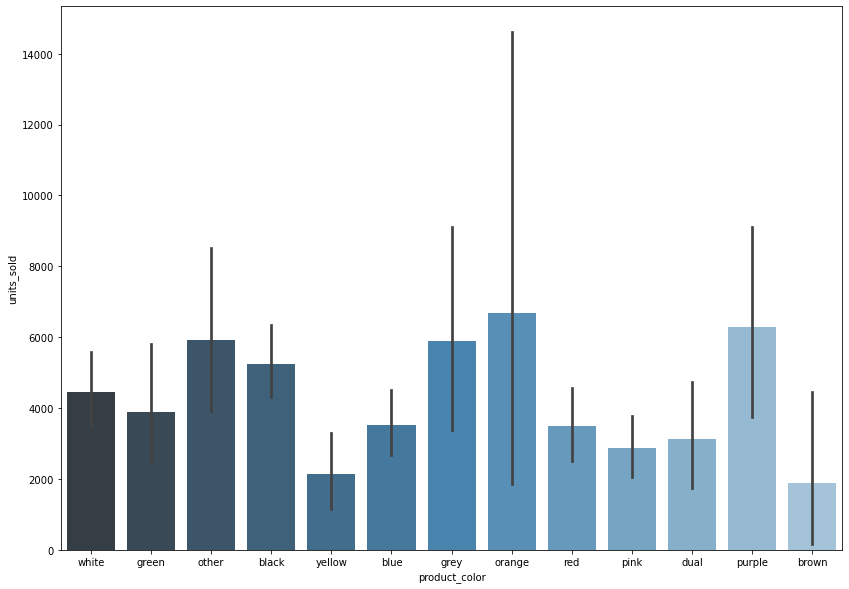

In [27]:
fig, ax = plt.subplots(figsize=(14,10))
sns.barplot(x="product_color", y="units_sold", data=df, palette="Blues_d",ax=ax)

#### Column: product_variation_size_id

In [28]:
df['product_variation_size_id'].unique()

array(['M', 'XS', 'S', 'Size-XS', 'M.', 'XXS', 'L', 'XXL', nan, 'S.', 's',
       'choose a size', 'XS.', '32/L', 'Suit-S', 'XXXXXL', 'EU 35', '4',
       'Size S.', '1m by 3m', '3XL', 'Size S', 'XL', 'Women Size 36',
       'US 6.5 (EU 37)', 'XXXS', 'SIZE XS', '26(Waist 72cm 28inch)',
       'Size XXS', '29', '1pc', '100 cm', 'One Size', 'SIZE-4XL', '1',
       'S/M(child)', '2pcs', 'XXXL', 'S..', '30 cm', '5XL', '33',
       'Size M', '100 x 100cm(39.3 x 39.3inch)', '100pcs', '2XL', '4XL',
       'SizeL', 'SIZE XXS', 'XXXXL', 'Base & Top & Matte Top Coat',
       'size S', '35', '34', 'SIZE-XXS', 'S(bust 88cm)',
       'S (waist58-62cm)', 'S(Pink & Black)', '20pcs', 'US-S',
       'Size -XXS', 'X   L', 'White', '25', 'Size-S', 'Round',
       'Pack of 1', '1 pc.', 'S Diameter 30cm', '6XL',
       'AU plug Low quality', '5PAIRS', '25-S', 'Size/S', 'S Pink',
       'Size-5XL', 'daughter 24M', '2', 'Baby Float Boat', '10 ml', '60',
       'Size-L', 'US5.5-EU35', '10pcs', '17', 'Size-XXS

As we can see, there are a lot of different sizes, let's make some cleaning 

In [29]:
df['product_variation_size_id'] = df['product_variation_size_id'].str.lower()\
                                .str.replace('.', '')\
                                .str.replace('size--', '')\
                                .str.replace('size -', '')\
                                .str.replace('size/', '')\
                                .str.replace('size ', '')\
                                .str.replace('size-', '')

df['product_variation_size_id'] = df['product_variation_size_id'].replace('2xl', 'xl')\
                                .replace('3xl', 'xl')\
                                .replace('4xl', 'xl')\
                                .replace('5xl', 'xl')\
                                .replace('6xl', 'xl')\
                                .replace('x   l', 'xl')\
                                .replace('sizel', 'l')\
                                .replace('x   l', 'xl')\
                                .replace('size4xl', 'xl')\
                                .replace('1 pc - xl', 'xl')

def size_cleaning(col):
    if col in 'xl,l,s,xs,m,xxl,xxxs,xxxxxl,xxxxl'.split(','):
        return col
    else:
        return 'other'
    
df['product_variation_size_id'] = df['product_variation_size_id'].replace(np.nan, 'other')\
                                .apply(size_cleaning)

In [30]:
df['product_variation_size_id'].unique()

array(['m', 'xs', 's', 'other', 'l', 'xxl', 'xxxxxl', 'xl', 'xxxs',
       'xxxxl'], dtype=object)

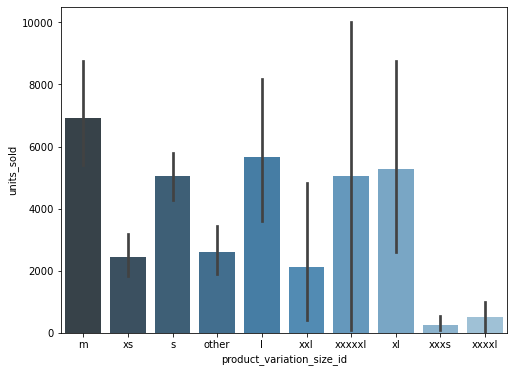

In [31]:
fig, ax = plt.subplots(figsize=(8,6))
sns.barplot(x="product_variation_size_id", y="units_sold", data=df, palette="Blues_d",ax=ax)

#### Column: tags

In [32]:
df['tags'].unique()

array(["Summer,Fashion,womenunderwearsuit,printedpajamasset,womencasualshort,Women's Fashion,flamingo,loungewearset,Casual,Shirt,casualsleepwear,Shorts,flamingotshirt,Elastic,Vintage,Tops,tshirtandshortsset,Women,Sleepwear,Print,womenpajamasset,womennightwear,Pajamas,womensleepwearset",
       "Mini,womens dresses,Summer,Patchwork,fashion dress,Dress,Mini dress,Women's Fashion,Women S Clothing,backless,party,summer dresses,sleeveless,sexy,Casual",
       "Summer,cardigan,women beachwear,chiffon,Sexy women,Coat,summercardigan,openfront,short sleeves,Swimsuit,Women's Fashion,leaf,Green,printed,Spring,longcardigan,Women,Beach,kimono",
       ...,
       "bohemia,Plus Size,dandelionfloralprinted,short sleeves,yoga top,bohotshirt,Cool T-Shirts,Women's Fashion,Fashion,short sleeve shirt,Casual,Women,Shorts,Yoga,Shirt,Sleeve,graphic tee,Tee Shirt,T Shirts,boho,bohoshirt,Print,Casual Tops,Tops",
       "runningshort,Beach Shorts,beachpant,menbeachshort,Men,sailboatshort,beach swimwear,Men's Fa

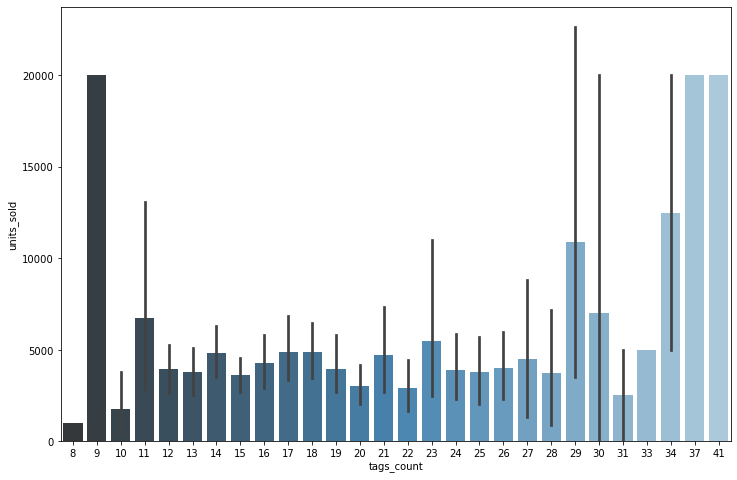

In [33]:
df['tags_count'] = df['tags'].str.split(',').str.len()
fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(x="tags_count", y="units_sold", data=df, palette="Blues_d",ax=ax)

Products with tags more than 35 are more discoverable and are thus bought more often.There is a sudden spike at just below 10 tags.

In [34]:
df.drop(['tags'], inplace=True, axis=1)

#### Column: origin_country

In [35]:
df['origin_country'].isna().value_counts()

False    1556
True       17
Name: origin_country, dtype: int64

In [36]:
df.groupby('origin_country').agg(['count', 'sum'])['units_sold']

,count,sum
origin_country,,
AT,1,100
CN,1516,6651245
GB,1,1000
SG,2,20100
US,31,43560
VE,5,350


China is the major origin country of the product, so we will fill the NaN by CH. 

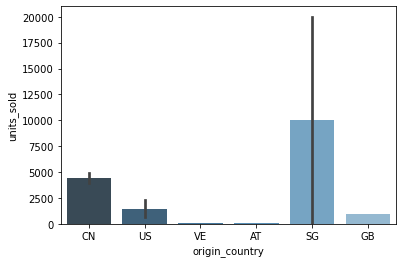

In [37]:
sns.barplot(x="origin_country", y="units_sold", data=df, palette="Blues_d")

#### Column: urgency_text

In [38]:
df.urgency_text.isna().value_counts()

True     1100
False     473
Name: urgency_text, dtype: int64

In [39]:
df.urgency_text.value_counts()

Quantité limitée !                  472
Réduction sur les achats en gros      1
Name: urgency_text, dtype: int64

As we can see above, we have 1100 NaN values and almost always the same values. So we will drop this column.

In [40]:
df.drop(['urgency_text'], inplace=True, axis=1)

### Merchant Information Columns

In [41]:
df[['merchant_title','merchant_name','merchant_info_subtitle','merchant_rating_count','merchant_rating','merchant_id','merchant_has_profile_picture','merchant_profile_picture']]

,merchant_title,merchant_name,merchant_info_subtitle,merchant_rating_count,merchant_rating,merchant_id,merchant_has_profile_picture,merchant_profile_picture
0,zgrdejia,zgrdejia,(568 notes),568,4.128521,595097d6a26f6e070cb878d1,0,NaN
1,SaraHouse,sarahouse,"83 % avis positifs (17,752 notes)",17752,3.899673,56458aa03a698c35c9050988,0,NaN
2,hxt520,hxt520,86 % avis positifs (295 notes),295,3.989831,5d464a1ffdf7bc44ee933c65,0,NaN
3,allenfan,allenfan,"(23,832 notes)",23832,4.020435,58cfdefdacb37b556efdff7c,0,NaN
4,youngpeopleshop,happyhorses,"85 % avis positifs (14,482 notes)",14482,4.001588,5ab3b592c3911a095ad5dadb,0,NaN
...,...,...,...,...,...,...,...,...
1568,cxuelin99126,cxuelin99126,"90 % avis positifs (5,316 notes)",5316,4.224605,5b507899ab577736508a0782,0,NaN
1569,sell best quality goods,sellbestqualitygoods,"(4,435 notes)",4435,3.696054,54d83b6b6b8a771e478558de,0,NaN
1570,shixueying,shixueying,86 % avis positifs (210 notes),210,3.961905,5b42da1bf64320209fc8da69,0,NaN
1571,modai,modai,77 % avis positifs (31 notes),31,3.774194,5d56b32c40defd78043d5af9,0,NaN


#### Column: merchant_title, merchant_name, merchant_id, merchant_profile_picture

As we did above with the product information : merchant_title, merchant_name, merchant_id, merchant_profile_picture and merchant_info_subtitle is useless.

In [42]:
df = df.drop(["merchant_title","merchant_name","merchant_id", "merchant_profile_picture","merchant_info_subtitle"], axis = 1)

#### Column: merchant_profile_picture

In [43]:
df['merchant_has_profile_picture'].isna().value_counts()

False    1573
Name: merchant_has_profile_picture, dtype: int64

There is no any NaN in the merchant_has_profile_picture column.

#### Column: shipping_option_name

In [44]:
df.groupby('shipping_option_name').agg(['count', 'sum'])['units_sold']

,count,sum
shipping_option_name,,
Ekspresowa wysyłka,1,10000
Envio Padrão,9,22400
Envío normal,5,16100
Expediere Standard,6,2400
Livraison Express,3,1200
Livraison standard,1508,6610705
Spedizione standard,2,1100
Standard Shipping,21,88550
Standardowa wysyłka,3,30100


In [45]:
df['shipping_option_name'].isna().value_counts()

False    1573
Name: shipping_option_name, dtype: int64

The shipping_option_name seems not really relevant, the shipping option is mainly "Livraison standard", so we will drop it.

In [46]:
df = df.drop(["shipping_option_name"], axis = 1)

### Ratings

They all have very high correlation with the target variable and have 45 missing values each.
It turns out that these products with missing values for these 5 columns have no ratings (rating_count=0) 
So let's replace these values with zero. Also we find that the value of 'rating' column for these products is 5 which is unlikely given the products have zero rating


In [47]:
df.update(df[['rating_five_count', 'rating_four_count', 'rating_three_count','rating_two_count', 'rating_one_count']].fillna(0))
df.loc[df['rating_count']==0, 'rating'] = 0

In [48]:
df[['rating_five_count', 'rating_four_count', 'rating_three_count','rating_two_count', 'rating_one_count', 'rating_count', 'rating']].head()

,rating_five_count,rating_four_count,rating_three_count,rating_two_count,rating_one_count,rating_count,rating
0,26.0,8.0,10.0,1.0,9.0,54,3.76
1,2269.0,1027.0,1118.0,644.0,1077.0,6135,3.45
2,5.0,4.0,2.0,0.0,3.0,14,3.57
3,295.0,119.0,87.0,42.0,36.0,579,4.03
4,6.0,4.0,2.0,2.0,6.0,20,3.10


We consider that columns 'rating_count' and 'rating' are very useful for our model as they give a sense of how much people has purchased the product and therefore left a rating, and how satisfied they actually were with the listing (from 1 to 5). On the other hand, we can drop the individual rating count columns (from 1 to 5 stars) because we already have a summarized value of them (rating).

In [49]:
df = df.drop(["rating_five_count","rating_four_count","rating_three_count", "rating_two_count", "rating_one_count"], axis = 1)

### Unit Sold & Success

We will treat our problem as both, as a regression task and as a classification task. For the regression case, we simply use the number of units sold as the target variable ('units_sold'). On the other hand, for the classification task, we need to create a new variable, 'success', which will have 2 possible values: Successful and Not Successful based on the number of units sold.

Because we don't have more information for this project (such as historical data), we decide to define the success of a product based on a comparison in the number of units sold with respect to the rest of the products on the website listing. That is, if the number of units sold is above the median, it will be considered as Successful, if it is below, it will be considered as Not Successful.

In [50]:
quantiles = df['units_sold'].quantile([0.5]).values
def make_class(row,quantiles = quantiles):
    
    if row < quantiles[0]:
        return 'Not Successful'
    else:
        return 'Successful'

In [51]:
df['success'] = df['units_sold'].apply(make_class)

### Correlation Matrix with the new dataframe

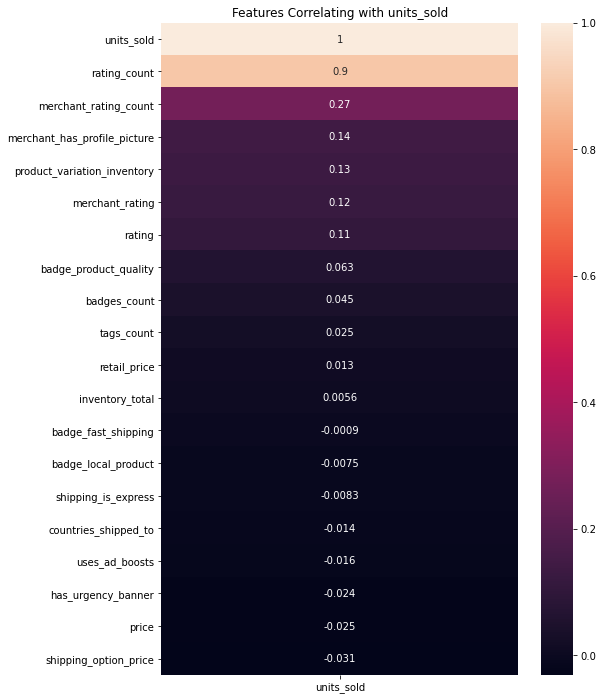

In [52]:
target = 'units_sold'

plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(df.corr()[[target]].sort_values(by=target, ascending=False),annot=True)
heatmap.set_title(f'Features Correlating with {target}');

From the Features Correlating results with Units Sold, we can drop badge_local_product, badge_fast_shipping, shipping_is_express and inventory_total.

In [53]:
df = df.drop(["badge_local_product","badge_fast_shipping","shipping_is_express","inventory_total"], axis = 1)

The new list of the columns:

In [54]:
list(df.columns) 

['price',
 'retail_price',
 'units_sold',
 'uses_ad_boosts',
 'rating',
 'rating_count',
 'badges_count',
 'badge_product_quality',
 'product_color',
 'product_variation_size_id',
 'product_variation_inventory',
 'shipping_option_price',
 'countries_shipped_to',
 'has_urgency_banner',
 'origin_country',
 'merchant_rating_count',
 'merchant_rating',
 'merchant_has_profile_picture',
 'tags_count',
 'success']

In [55]:
final_df = df

### Categorical value encoding

In [56]:
final_df = pd.get_dummies(final_df, 
                           columns = ['product_color'],
                           prefix = 'color_',
                           drop_first = True)
final_df.head()

,price,retail_price,units_sold,uses_ad_boosts,rating,rating_count,badges_count,badge_product_quality,product_variation_size_id,product_variation_inventory,...,color__dual,color__green,color__grey,color__orange,color__other,color__pink,color__purple,color__red,color__white,color__yellow
0,16.00,14,100,0,3.76,54,0,0,m,50,...,0,0,0,0,0,0,0,0,1,0
1,8.00,22,20000,1,3.45,6135,0,0,xs,50,...,0,1,0,0,0,0,0,0,0,0
2,8.00,43,100,0,3.57,14,0,0,xs,1,...,0,0,0,0,1,0,0,0,0,0
3,8.00,8,5000,1,4.03,579,0,0,m,50,...,0,0,0,0,0,0,0,0,0,0
4,2.72,3,100,1,3.10,20,0,0,s,1,...,0,0,0,0,0,0,0,0,0,1


In [57]:
final_df = pd.get_dummies(final_df, 
                           columns = ['origin_country'],
                           prefix = 'origin_country_',
                           drop_first = True)
final_df.head()

,price,retail_price,units_sold,uses_ad_boosts,rating,rating_count,badges_count,badge_product_quality,product_variation_size_id,product_variation_inventory,...,color__pink,color__purple,color__red,color__white,color__yellow,origin_country__CN,origin_country__GB,origin_country__SG,origin_country__US,origin_country__VE
0,16.00,14,100,0,3.76,54,0,0,m,50,...,0,0,0,1,0,1,0,0,0,0
1,8.00,22,20000,1,3.45,6135,0,0,xs,50,...,0,0,0,0,0,1,0,0,0,0
2,8.00,43,100,0,3.57,14,0,0,xs,1,...,0,0,0,0,0,1,0,0,0,0
3,8.00,8,5000,1,4.03,579,0,0,m,50,...,0,0,0,0,0,1,0,0,0,0
4,2.72,3,100,1,3.10,20,0,0,s,1,...,0,0,0,0,1,1,0,0,0,0


In [58]:
final_df = pd.get_dummies(final_df, 
                           columns = ['product_variation_size_id'],
                           prefix = 'size_',
                           drop_first = True)
final_df.head()

,price,retail_price,units_sold,uses_ad_boosts,rating,rating_count,badges_count,badge_product_quality,product_variation_inventory,shipping_option_price,...,origin_country__VE,size__m,size__other,size__s,size__xl,size__xs,size__xxl,size__xxxs,size__xxxxl,size__xxxxxl
0,16.00,14,100,0,3.76,54,0,0,50,4,...,0,1,0,0,0,0,0,0,0,0
1,8.00,22,20000,1,3.45,6135,0,0,50,2,...,0,0,0,0,0,1,0,0,0,0
2,8.00,43,100,0,3.57,14,0,0,1,3,...,0,0,0,0,0,1,0,0,0,0
3,8.00,8,5000,1,4.03,579,0,0,50,2,...,0,1,0,0,0,0,0,0,0,0
4,2.72,3,100,1,3.10,20,0,0,1,1,...,0,0,0,1,0,0,0,0,0,0


Let's check is there are any NaN:

In [59]:
final_df.isna().any().to_frame()

,0
price,False
retail_price,False
units_sold,False
uses_ad_boosts,False
rating,False
rating_count,False
badges_count,False
badge_product_quality,False
product_variation_inventory,False
shipping_option_price,False


In [60]:
final = final_df.dropna()

In [61]:
print('Shape of Dataset:' , final.shape )

Shape of Dataset: (1573, 43)


# 3. Modeling & Explaining

In [62]:
import graphviz

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from interpret.glassbox import ExplainableBoostingClassifier, LogisticRegression, ClassificationTree, DecisionListClassifier
from interpret import show
from interpret.data import ClassHistogram
from interpret.perf import ROC

from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import explained_variance_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import median_absolute_error
from sklearn.inspection import permutation_importance
from sklearn.inspection import plot_partial_dependence

import xgboost
import scikitplot as skplt
import shap
import lime
import lime.lime_tabular
!pip3 install pycebox
from pycebox.ice import ice, ice_plot

shap.initjs()

## 3.1) As a Classification task

In [63]:
X = final.drop(['units_sold','success'], axis=1)
y = final['success']

In [64]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, stratify=final['success'])

In [65]:
#We need a boolean version of the target variable for some algorithms
y_train_bool = y_train.apply(lambda x: True if x=='Successful' else False)
y_test_bool = y_test.apply(lambda x: True if x=='Successful' else False)

Now, we inspect a little our training dataset by using the Interpret library

In [66]:
hist = ClassHistogram().explain_data(X_train, y_train, name = 'Train Data')
show(hist)

<!-- http://127.0.0.1:7001/1596280103792/ -->

Next, we make dependency plots for some relevant features:

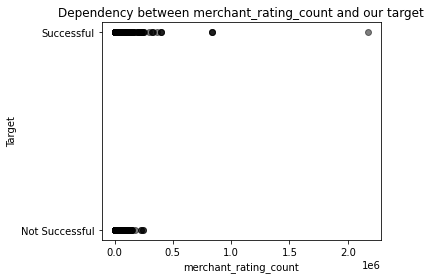

In [67]:
labels = final['success'].values
fig, ax = plt.subplots(figsize=(5, 4))
ax.scatter(final.merchant_rating_count, labels, c='k', alpha=0.5);
ax.set_xlabel('merchant_rating_count');
ax.set_ylabel('Target');
ax.set_title('Dependency between merchant_rating_count and our target');

Unfortunately we can't really see a clear dependency between merchant_rating_count and our target

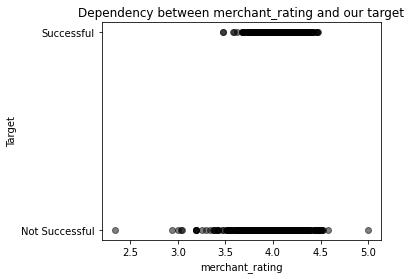

In [68]:
labels = final['success'].values
fig, ax = plt.subplots(figsize=(5, 4))
ax.scatter(final.merchant_rating, labels, c='k', alpha=0.5);
ax.set_xlabel('merchant_rating');
ax.set_ylabel('Target');
ax.set_title('Dependency between merchant_rating and our target');

We can see that when the merchant rating is less than 3.5 the product has a high chance to be unsuccessful. When the rating is above it more difficult to see a clear dependency

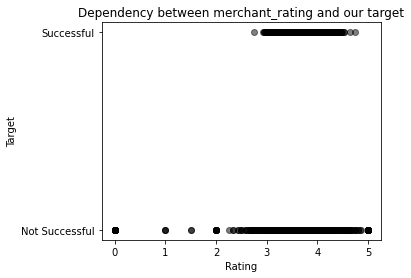

In [69]:
labels = final['success'].values
fig, ax = plt.subplots(figsize=(5, 4))
ax.scatter(final.rating, labels, c='k', alpha=0.5);
ax.set_xlabel('Rating');
ax.set_ylabel('Target');
ax.set_title('Dependency between merchant_rating and our target');

We can see that when the product rating is less than 3 the product has a high chance to be unsuccessful. When the rating is above it more difficult to see a clear dependency.

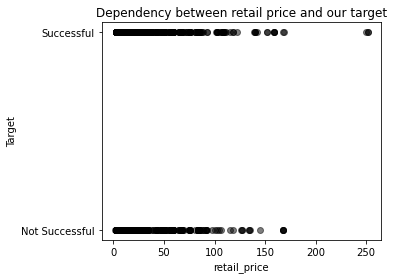

In [70]:
labels = final['success'].values
fig, ax = plt.subplots(figsize=(5, 4))
ax.scatter(final.retail_price, labels, c='k', alpha=0.5);
ax.set_xlabel('retail_price');
ax.set_ylabel('Target');
ax.set_title('Dependency between retail price and our target');

Unfortunately we can't really see a clear dependency between the retail price and our target

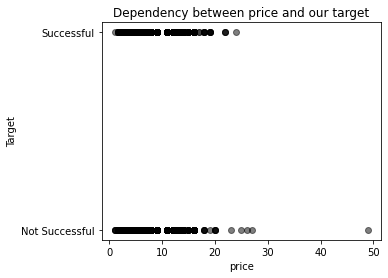

In [71]:
labels = final['success'].values
fig, ax = plt.subplots(figsize=(5, 4))
ax.scatter(final.price, labels, c='k', alpha=0.5);
ax.set_xlabel('price');
ax.set_ylabel('Target');
ax.set_title('Dependency between price and our target');

Unfortunately we can't really see a clear dependency between the price and our target.

- Decision Tree

In [72]:
# create a classifier object 
DT_CLF = DecisionTreeClassifier(random_state = 0) #Using by default hyperparameters
  
# fit the DT_CLF with X_train and y_train data 
DT_CLF.fit(X_train, y_train) 
y_pred = DT_CLF.predict(X_test)
#Printing metrics
print(classification_report(y_test,y_pred))

                precision    recall  f1-score   support

Not Successful       0.89      0.96      0.93       130
    Successful       0.97      0.92      0.94       185

      accuracy                           0.94       315
     macro avg       0.93      0.94      0.94       315
  weighted avg       0.94      0.94      0.94       315



In [73]:
#We do some Hyperparameter Tuning

pgrid = {"max_depth": [1, 2, 3, 4, 5, 6, 7, 10, 15, 20, 30, 50, 100],
      "min_samples_split": [2, 3, 5, 10, 15, 20]}

grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid=pgrid, cv=10 , n_jobs = 4 , verbose = 1)
grid_search.fit(X_train, y_train)
best_tree = grid_search.best_estimator_
y_pred = best_tree.predict(X_test)


best_max_depth=grid_search.best_estimator_.max_depth
best_min_samples_split=grid_search.best_estimator_.min_samples_split

print("best_max_depth ", best_max_depth)
print("best_min_samples_split ", best_min_samples_split)

Fitting 10 folds for each of 78 candidates, totalling 780 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    3.5s


best_max_depth  4
best_min_samples_split  10


[Parallel(n_jobs=4)]: Done 780 out of 780 | elapsed:    7.4s finished


In [74]:
y_pred = best_tree.predict(X_test)
#Printing metrics
print(classification_report(y_test,y_pred))

                precision    recall  f1-score   support

Not Successful       0.91      0.95      0.93       130
    Successful       0.97      0.93      0.95       185

      accuracy                           0.94       315
     macro avg       0.94      0.94      0.94       315
  weighted avg       0.94      0.94      0.94       315



Now's let's draw the decision tree graph to understand better our predictions:

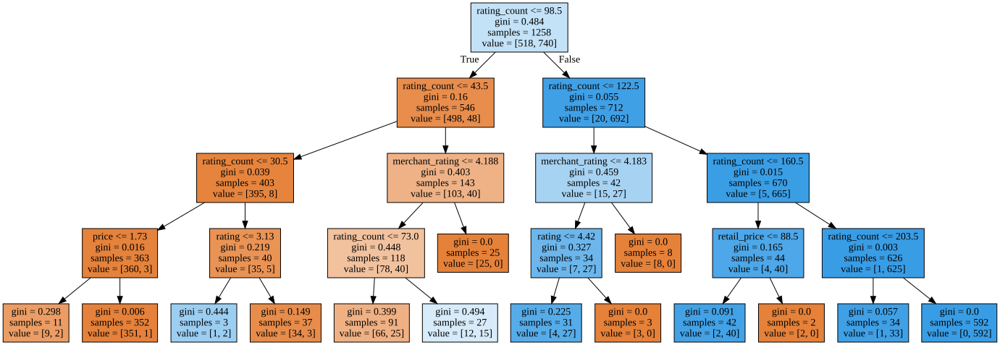

In [75]:
dot_data = tree.export_graphviz(best_tree, out_file=None, feature_names=X.columns, filled=True)
# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

We can clearly see that Rating Count is the most important feature when determining the splits of the tree. It is asked at the root node if Rating Count is lower or equal than 98.5. Some others important features are the Merchant Rating, the Price, the Rating and the Countries Shipped To.

Decision Trees are simple to explain and understand how they work, but their performance is usually limited. Nevertheless, we can combine many of such predictors to create more robust methods, such as a random forest. These ensemble methods can achieve a higher performance, but in exchange they become harder to interpret.

In the following we will try to explain the predictions made by some ensemble learning algorithms using various tools. First, we will use post-hoc explainable models, such as LIME (Explanation by simplification), SHAP (Feature relevance explanation) and ICE Plots (Visual explanation). We will also use an interpretable glassbox model, such as the Explainable Boosting Machine. This way, we will go through the 2 main approaches in Explainable Artificial Intelligence.

- Random Forest and LIME

In [76]:
#Training a Random Forest using the BY DEFAULT HYPERPARAMETERS
rfr = RandomForestClassifier(random_state=10)
rfr.fit(X_train, y_train)
y_pred = rfr.predict(X_test)
print(classification_report(y_test,y_pred))

                precision    recall  f1-score   support

Not Successful       0.91      0.99      0.95       130
    Successful       0.99      0.94      0.96       185

      accuracy                           0.96       315
     macro avg       0.95      0.96      0.96       315
  weighted avg       0.96      0.96      0.96       315



In [77]:
#Let's see if we can improve this accuracy by using different Hyperparameters

# Number of trees in random forest
n_estimators = [100 , 200 , 300, 400]
# Number of features to consider at every split
max_features = ['auto', None]
# Maximum number of levels in tree
max_depth = [5,10,15,20,None]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
rfr = RandomForestClassifier(random_state=1)

rfr_random = RandomizedSearchCV(estimator = rfr, param_distributions = random_grid, n_iter = 100,cv = 2 ,  verbose=1, random_state=42, n_jobs = -1)
rfr_random.fit(X_train, y_train)


Fitting 2 folds for each of 100 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   48.8s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   51.2s finished


RandomizedSearchCV(cv=2, estimator=RandomForestClassifier(random_state=1),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'max_depth': [5, 10, 15, 20, None],
                                        'max_features': ['auto', None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400]},
                   random_state=42, verbose=1)

In [78]:
print("Best params : " ,rfr_random.best_params_ )
best_randomf = rfr_random.best_estimator_
y_pred = best_randomf.predict(X_test)
print(classification_report(y_test,y_pred))

Best params :  {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': None}
                precision    recall  f1-score   support

Not Successful       0.91      0.98      0.94       130
    Successful       0.99      0.93      0.96       185

      accuracy                           0.95       315
     macro avg       0.95      0.96      0.95       315
  weighted avg       0.96      0.95      0.95       315



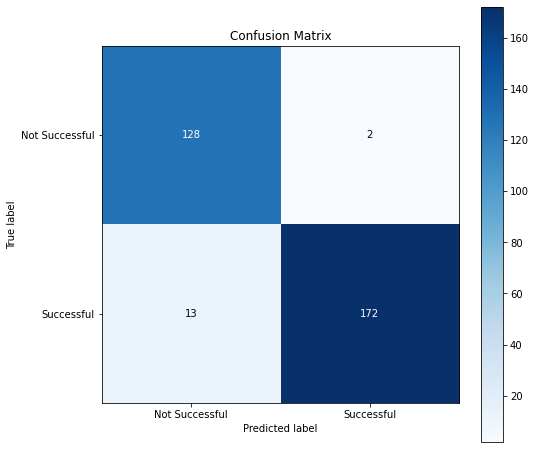

In [79]:
skplt.metrics.plot_confusion_matrix(y_test, y_pred, figsize=(8,8))
plt.show()

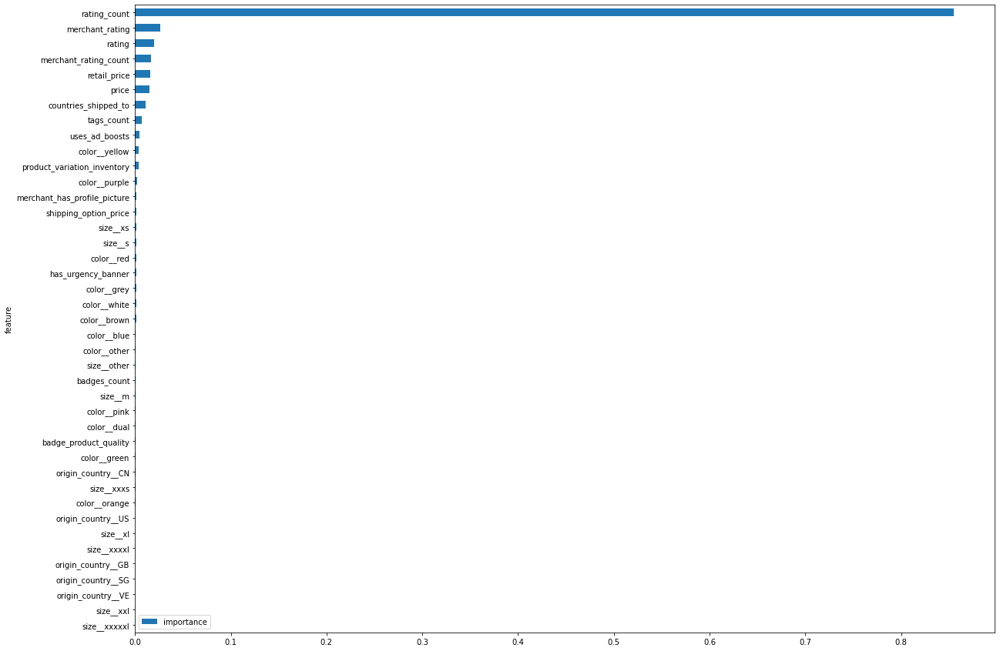

In [80]:
features = pd.DataFrame()
features['feature'] = X_train.columns
features['importance'] = best_randomf.feature_importances_
features.sort_values(by=['importance'], ascending=True, inplace=True)
features.set_index('feature', inplace=True)

features.plot(kind='barh', figsize=(20, 15))

In [81]:
predict_fn_rf = lambda x: best_randomf.predict_proba(x).astype(float) 
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,feature_names = X_train.columns,class_names=['Not Successful','Successful'],kernel_width=5)

In [82]:
#actual label
y_test.iloc[0]

'Successful'

In [83]:
choosen_instance = X_test.iloc[[0]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=15)
exp.show_in_notebook(show_all=False)

In [84]:
#actual label
y_test.iloc[4]

'Not Successful'

In [85]:
choosen_instance = X_test.iloc[[4]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=15)
exp.show_in_notebook(show_all=False)

In these two samples, we can see how the model predicts "Successful" and "Not Successful" directly based on the 'rating_count' feature. That is, when this value is large, e.g. in the upper quartile (>876), the model considers the product as successful, while when it is small, e.g. in the lower quartile (<25), it is considered as not successful. Now we will see a few examples when the 'rating_count' variable is neither large nor small.

In [86]:
#actual label
y_test.iloc[5]

'Not Successful'

In [87]:
choosen_instance = X_test.iloc[[5]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=15)
exp.show_in_notebook(show_all=False)

In [88]:
#actual label
y_test.iloc[12]

'Successful'

In [89]:
choosen_instance = X_test.iloc[[12]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=15)
exp.show_in_notebook(show_all=False)

In [90]:
#actual label
y_test.iloc[1]

'Successful'

In [91]:
choosen_instance = X_test.iloc[[1]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=15)
exp.show_in_notebook(show_all=False)

In [92]:
#actual label
y_test.iloc[2]

'Not Successful'

In [93]:
choosen_instance = X_test.iloc[[2]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=15)
exp.show_in_notebook(show_all=False)

In these cases, 'rating_count' is not the only factor determining success, but we also see how the color (brown, orange, purple, etc.), the size (xxxs, xxxxl, xxl, etc.) and the country of origin (SG, VE, US, GB) factor in. Although in some cases the prediction is wrong (such as for y_test.iloc[1]),but we at least understand what features were considered to arrive to that conclusion. 

- Random Forest and ICE Curves

In [94]:
#Random Forest Hyperparameter Tuning

# Number of trees in random forest
n_estimators = [100 , 200 , 300, 400]
# Number of features to consider at every split
max_features = ['auto', None]
# Maximum number of levels in tree
max_depth = [5,10,15,20,None]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
rfr = RandomForestClassifier(random_state=1)

rfr_random = RandomizedSearchCV(estimator = rfr, param_distributions = random_grid, n_iter = 100,cv = 2 ,  verbose=1, random_state=42, n_jobs = -1)
rfr_random.fit(X_train, y_train_bool)


Fitting 2 folds for each of 100 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   42.4s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   44.5s finished


RandomizedSearchCV(cv=2, estimator=RandomForestClassifier(random_state=1),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'max_depth': [5, 10, 15, 20, None],
                                        'max_features': ['auto', None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400]},
                   random_state=42, verbose=1)

In [95]:
print("Best params : " ,rfr_random.best_params_ )
best_randomf = rfr_random.best_estimator_
y_pred = best_randomf.predict(X_test)
print(classification_report(y_test_bool,y_pred))

Best params :  {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': None}
              precision    recall  f1-score   support

       False       0.91      0.98      0.94       130
        True       0.99      0.93      0.96       185

    accuracy                           0.95       315
   macro avg       0.95      0.96      0.95       315
weighted avg       0.96      0.95      0.95       315



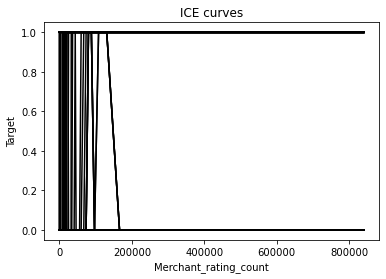

In [96]:
data = pd.DataFrame(X_train)
ice_df = ice(data,'merchant_rating_count', best_randomf.predict, num_grid_points=100)
ice_plot(ice_df,c='k');
plt.xlabel('Merchant_rating_count');
plt.ylabel('Target');
plt.title('ICE curves');

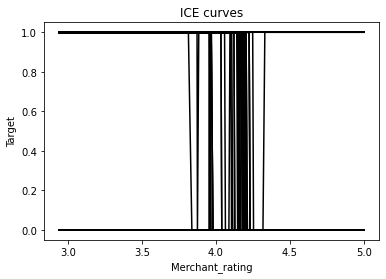

In [97]:
data = pd.DataFrame(X_train)
ice_df = ice(data,'merchant_rating', best_randomf.predict, num_grid_points=100)
ice_plot(ice_df,c='k');
plt.xlabel('Merchant_rating');
plt.ylabel('Target');
plt.title('ICE curves');

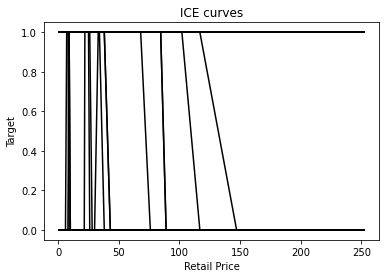

In [98]:
data = pd.DataFrame(X_train)
ice_df = ice(data,'retail_price', best_randomf.predict, num_grid_points=100)
ice_plot(ice_df,c='k');
plt.xlabel('Retail Price');
plt.ylabel('Target');
plt.title('ICE curves');

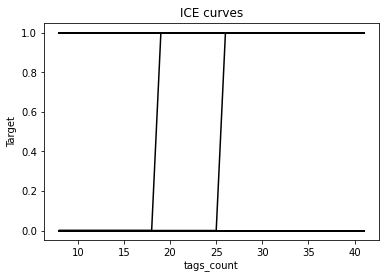

In [99]:
data = pd.DataFrame(X_train)
ice_df = ice(data,'tags_count', best_randomf.predict, num_grid_points=100)
ice_plot(ice_df,c='k');
plt.xlabel('tags_count');
plt.ylabel('Target');
plt.title('ICE curves');

As we saw in the lectures, ICE plot may lead to confusion explanation if there is many samples in the dataset, since overlapping line cannot be lisible.

Let's try PDP which is an average of ICE Lines

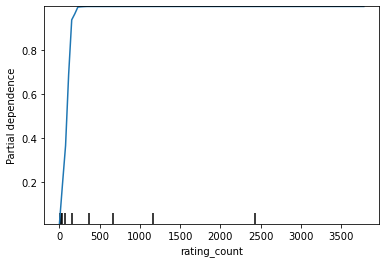

In [100]:
features = ['rating_count']
plot_partial_dependence(best_randomf, X_train, features) 

Here the PDP shows that a higher number of ratings given to the product listing corresponds to a more successful outcome in terms of units sold.

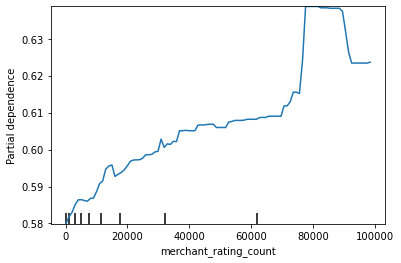

In [101]:
features = ['merchant_rating_count']
plot_partial_dependence(best_randomf, X_train, features) 

Here the PDP shows us that the more ratings the merchant has, the more successful the product in general is.

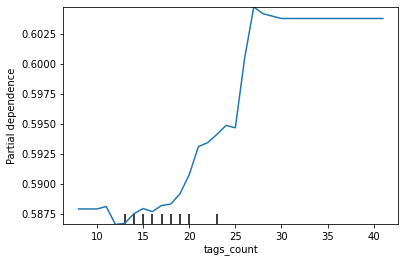

In [102]:
features = ['tags_count']
plot_partial_dependence(best_randomf, X_train, features) 

Here the PDP shows that the more tags the product listing has, the more successful its sale can be.

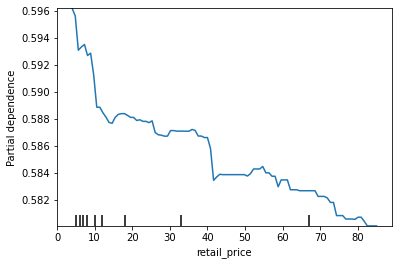

In [103]:
features = ['retail_price']
plot_partial_dependence(best_randomf, X_train, features) 

This PDP shows us that the smaller the retail price, the more successful the product in general is.

- Explainable Boosting Machine

We will use here a GlassBox Interpretable Method

In [104]:
ebm = ExplainableBoostingClassifier(random_state=1, n_jobs=-1)
ebm.fit(X_train, y_train)   #Works on dataframes and numpy arrays

ExplainableBoostingClassifier(feature_names=['price', 'retail_price',
                                             'uses_ad_boosts', 'rating',
                                             'rating_count', 'badges_count',
                                             'badge_product_quality',
                                             'product_variation_inventory',
                                             'shipping_option_price',
                                             'countries_shipped_to',
                                             'has_urgency_banner',
                                             'merchant_rating_count',
                                             'merchant_rating',
                                             'merchant_has_profile_picture',
                                             'tags_count', 'color__blue',
                                             'col...
                                             'categorical', 'continuous',
                

In [105]:
y_pred = ebm.predict(X_test)
print(classification_report(y_test,y_pred))

                precision    recall  f1-score   support

Not Successful       0.90      0.98      0.94       130
    Successful       0.99      0.92      0.96       185

      accuracy                           0.95       315
     macro avg       0.94      0.95      0.95       315
  weighted avg       0.95      0.95      0.95       315



In [106]:
ebm_global = ebm.explain_global(name='EBM')
show(ebm_global)

<!-- http://127.0.0.1:7001/1596660698272/ -->

From this last graph, we can say for example that for Rating Count, its positive influence on the prediction starts around after a value of 120, and after 200 it achieves its highest score. This feature has a median of 150, and these results confirm our belief that a large value of rating count is directly related with the success of a product. We can also see how smaller values of Price (less than 7) are usually positive related with the success of a product. Finally, we can also see that for higher values of Countries Shipped To, Rating, Product Variation Inventory and Tags Count there is in general a higher score, and therefore, a greater probability of success. 

Local Explanations

In the following we can see some explanations locally

In [107]:
ebm_local = ebm.explain_local(X_test[:10], y_test[:10], name='EBM')
show(ebm_local)

<!-- http://127.0.0.1:7001/1596662892096/ -->

Evaluating Performance of EBM

In [108]:
ebm_perf = ROC(ebm.predict_proba).explain_perf(X_test, y_test_bool, name='EBM')
show(ebm_perf)

<!-- http://127.0.0.1:7001/1596641237600/ -->

- XGBoost and SHAP

In [109]:
clf = xgboost.XGBClassifier()
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print(classification_report(y_pred, y_test))

C:\Users\marco\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[20:25:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
                precision    recall  f1-score   support

Not Successful       0.98      0.92      0.95       138
    Successful       0.94      0.98      0.96       177

      accuracy                           0.96       315
     macro avg       0.96      0.95      0.95       315
  weighted avg       0.96      0.96      0.96       315



C:\Users\marco\anaconda3\lib\site-packages\xgboost\data.py:112: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption



In [110]:
d_train = xgboost.DMatrix(X_train, label=y_train_bool)
d_test = xgboost.DMatrix(X_test, label=y_test_bool)

In [111]:
params = {
    "eta": 0.01, #Learning rate
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y_train_bool),
    "eval_metric": "logloss"
}

model = xgboost.train(params, d_train, 5000, evals = [(d_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.66995
[100]	test-logloss:0.28740
[200]	test-logloss:0.18497
[300]	test-logloss:0.15165
[400]	test-logloss:0.14064
[490]	test-logloss:0.13783


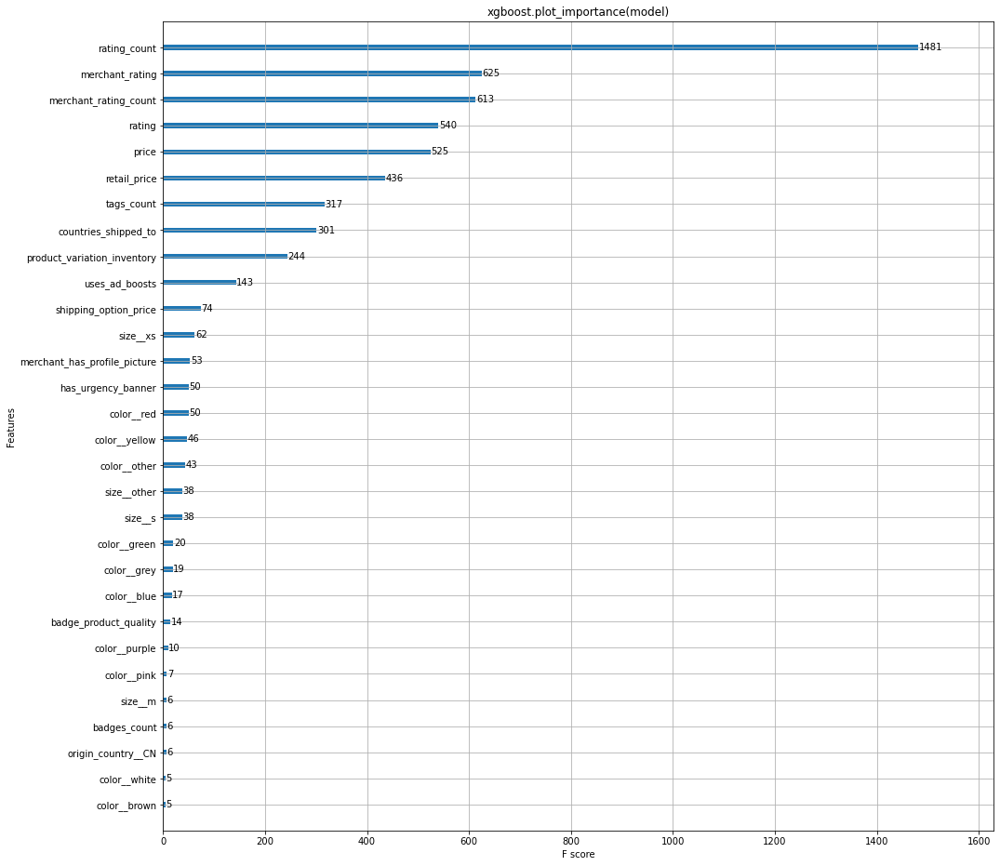

In [112]:
fig, ax = plt.subplots(figsize=(16,16))
xgboost.plot_importance(model,ax=ax)
pl.title("xgboost.plot_importance(model)")
pl.show()

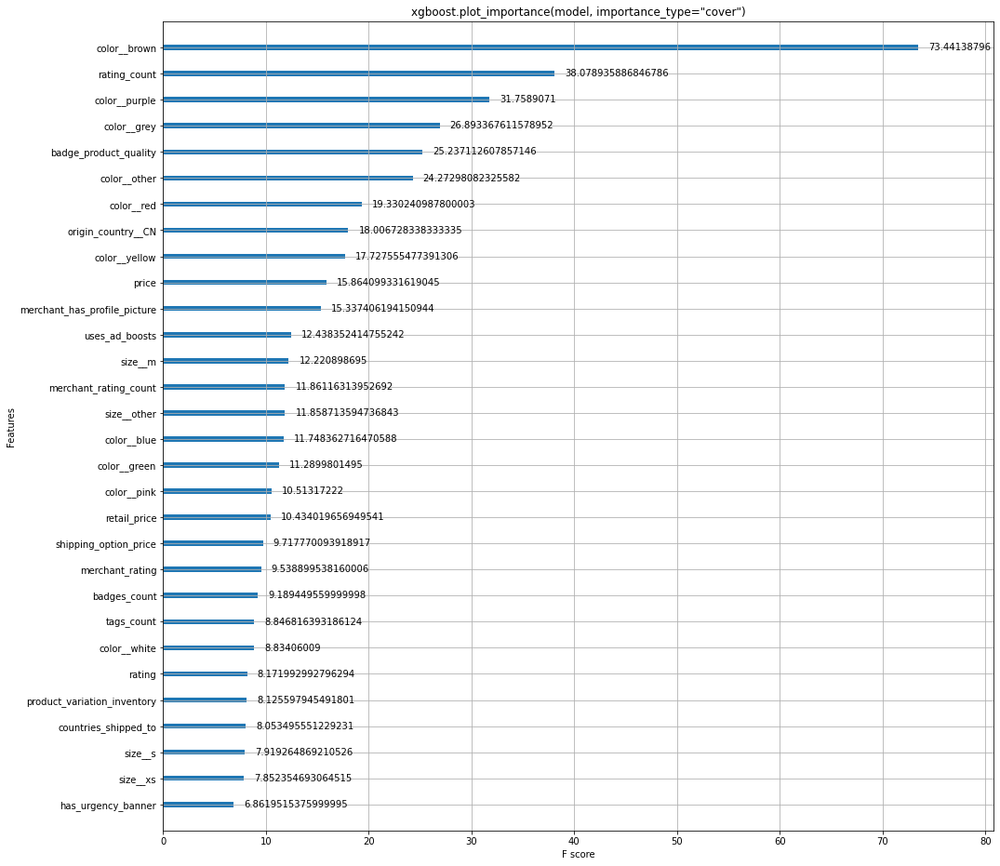

In [113]:
fig, ax = plt.subplots(figsize=(16,16))
xgboost.plot_importance(model, importance_type="cover",ax=ax)
pl.title('xgboost.plot_importance(model, importance_type="cover")')
pl.show()

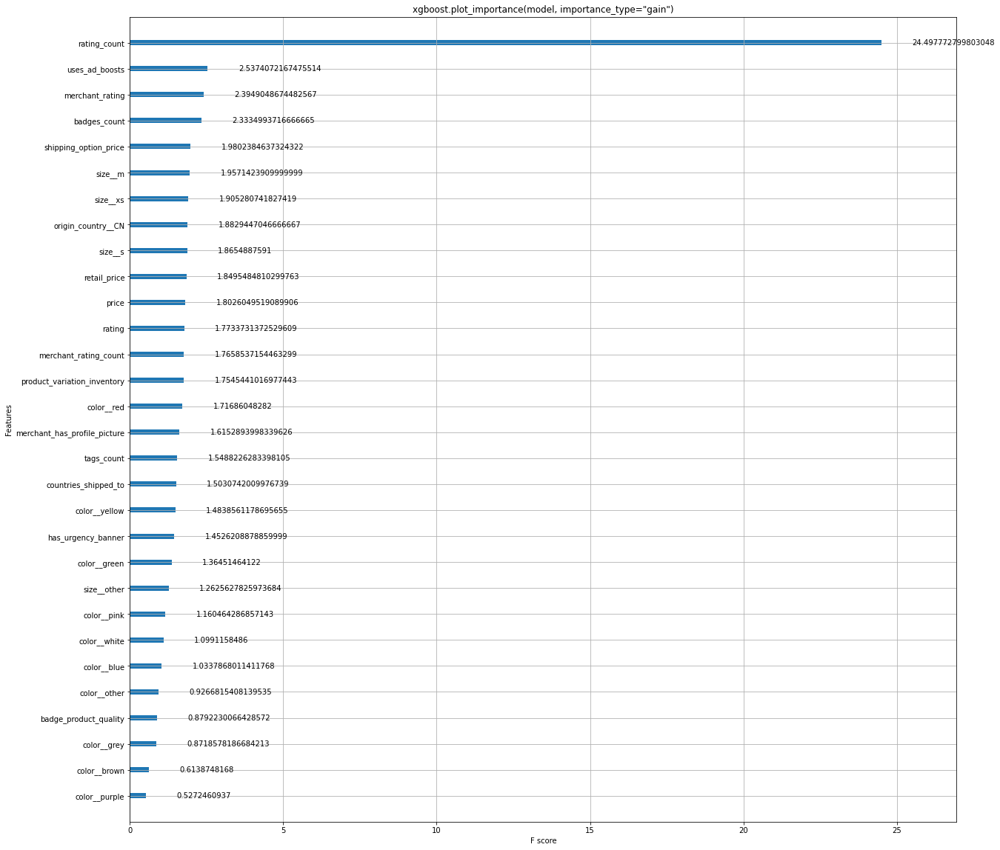

In [114]:
fig, ax = plt.subplots(figsize=(20,20))
xgboost.plot_importance(model, importance_type="gain",ax=ax)
pl.title('xgboost.plot_importance(model, importance_type="gain")')
pl.show()

These global feature importance summaries come with XGBoost. However, they are not very accurate and may contradict each other. Therefore, we use SHAP values, which are more consistent and will order the features correctly.

In [115]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

In [116]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X_test.iloc[0,:])

In [117]:
shap.force_plot(explainer.expected_value, shap_values[4,:], X_test.iloc[4,:])

In these 2 cases, we can see how almost all explanation of the prediction resides in the fact that the rating count is either a large, e.g 1783 (successful) or a small value, e.g 1 (not successful). However, in the following we show some cases in which rating count has an intermediate value and, therefore, it needs to be considered in conjunction with other features in order to explain fully the prediction.

In [118]:
shap.force_plot(explainer.expected_value, shap_values[21,:], X_test.iloc[21,:])

In [119]:
shap.force_plot(explainer.expected_value, shap_values[60,:], X_test.iloc[60,:])

In [120]:
shap.force_plot(explainer.expected_value, shap_values[12,:], X_test.iloc[12,:])

For this particular last sample, we can see that a large value for merchant rating count (1.264e+5), a small price (2) and a high value of rating (4.19) account for success of this product. On the other hand, we have a small value for rating count (81) and the uses ad boost as 0. However, the SHAP values magnitude of the former are greater, and therefore the prediction is that this product will be successful.

In [121]:
shap.force_plot(explainer.expected_value, shap_values[1,:], X_test.iloc[1,:])

In [122]:
shap.force_plot(explainer.expected_value, shap_values[2,:], X_test.iloc[2,:])

For this particular last sample, we can see how a small price (5) and a high value of tags count (23) account for success of this product. However, we also have a low value for rating count (45) and the uses ad boost as 0. The SHAP values magnitude of the latter are greater than the former, therefore the prediction is that this product won't be successful.

From these last 5 examples, we can see how some other features are important in explaining the final prediction when the rating count is neither small nor large. These features are the Merchant Rating, the Merchant Rating Count, the Price, the Tags Count, the Uses Ad Boosts, among others.

In [123]:
shap_values = explainer.shap_values(X)

Visualizing many predictions:

In [124]:
shap.force_plot(explainer.expected_value, shap_values[:1000,:], X.iloc[:1000,:])

Let's now do a bar chart of mean importance (average of SHAP values across the dataset):

Here we can confirm the high importance of the Rating Count, followed by the Merchant Rating, the Price, Uses Ad Boosts, Tags Count, etc.

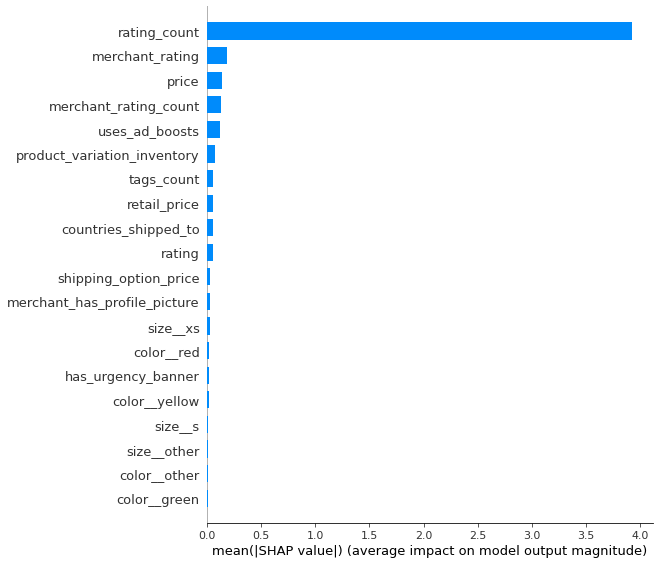

In [125]:
shap.summary_plot(shap_values, X, plot_type="bar")

SHAP Summary Plot:

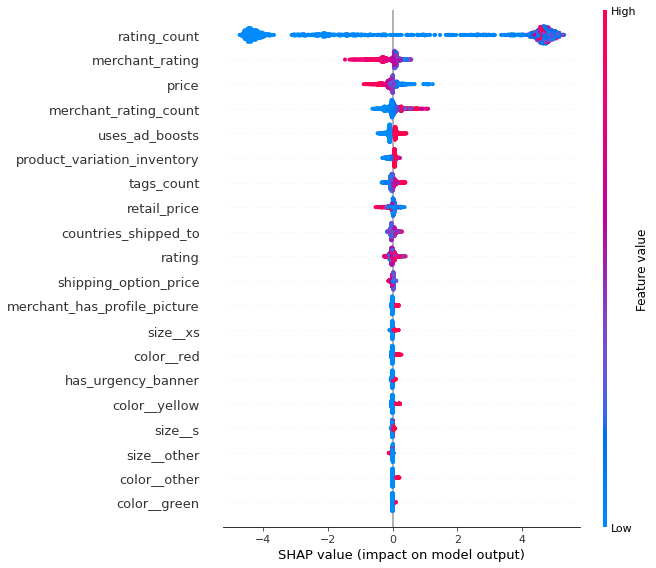

In [126]:
shap.summary_plot(shap_values, X)

Thanks to this summary plot, we can confirm our sample explanations. We can see here that a high rating count increases the SHAP value and, therefore, the probability of success. We can also see that little values for price increase the probability of success, while larger values of price decreases the probability of success. Similarly for Uses Ad Boosts, when this feature is 1, the probability of success increases, and when it is 0, decreases. Finally, for Merchant Rating Count, we can observe that in general a high value of it usually corresponds to a greater success, and for a low value, a smaller success.

SHAP Dependence Plots:

Showing the effect of a single feature across the dataset.

In here, we can see, for example, the approximately negative linear relationship between the price and the prediction. That is, the higher the price, the less successful the product.

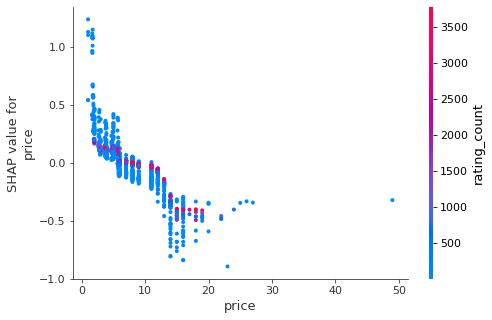

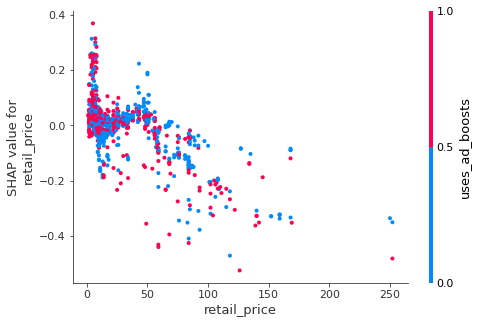

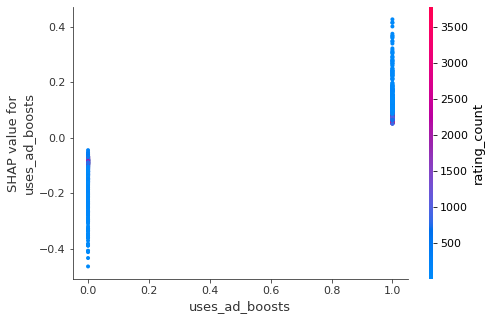

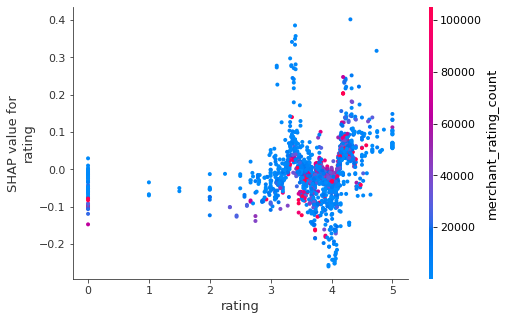

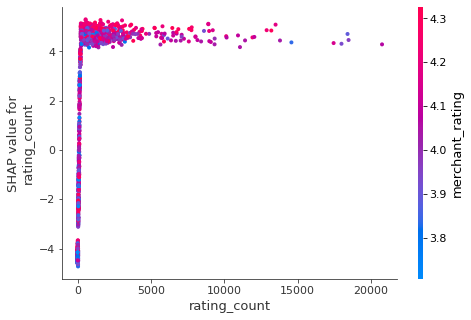

...

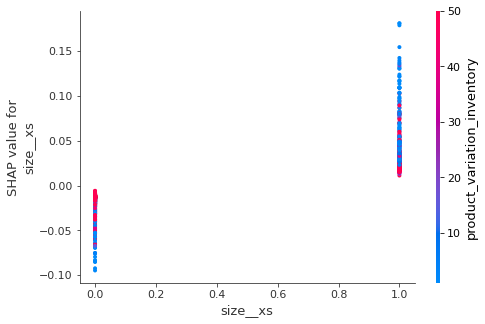

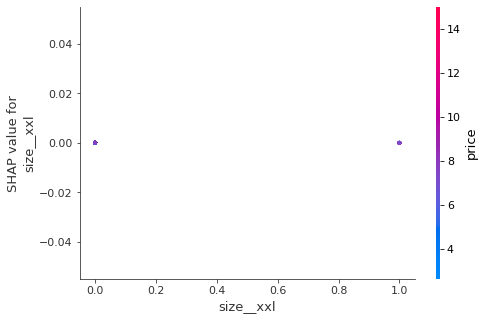

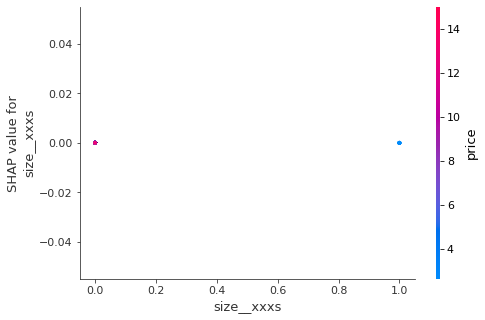

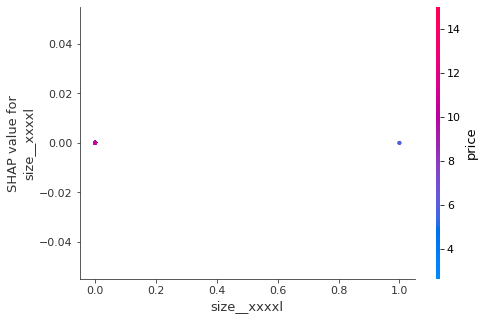

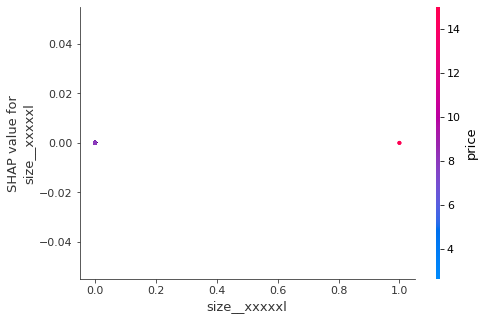

In [127]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X, display_features=X)

Simple Supervided Clustering:

The main idea here is to cluster product listings by their SHAP values because it could lead to groups relevant to the classification task (whether a listing is successful or not).

In [128]:
shap_pca50 = PCA(n_components=12).fit_transform(shap_values[:1000,:])
shap_embedded = TSNE(n_components=2, perplexity=50).fit_transform(shap_values[:1000,:])

In [129]:
cdict1 = {
    'red': ((0.0, 0.11764705882352941, 0.11764705882352941),
            (1.0, 0.9607843137254902, 0.9607843137254902)),

    'green': ((0.0, 0.5333333333333333, 0.5333333333333333),
              (1.0, 0.15294117647058825, 0.15294117647058825)),

    'blue': ((0.0, 0.8980392156862745, 0.8980392156862745),
             (1.0, 0.3411764705882353, 0.3411764705882353)),

    'alpha': ((0.0, 1, 1),
              (0.5, 1, 1),
              (1.0, 1, 1))
}

red_blue_solid = LinearSegmentedColormap('RedBlue', cdict1)

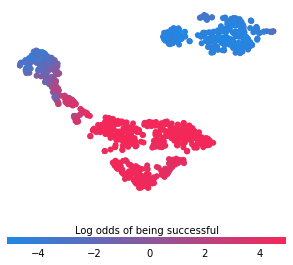

In [130]:
f = pl.figure(figsize=(5,5))
pl.scatter(shap_embedded[:,0],
           shap_embedded[:,1],
           c=shap_values[:1000,:].sum(1).astype(np.float64),
           linewidth=0, alpha=1., cmap=red_blue_solid)
cb = pl.colorbar(label="Log odds of being successful", aspect=40, orientation="horizontal")
cb.set_alpha(1)
cb.draw_all()
cb.outline.set_linewidth(0)
cb.ax.tick_params('x', length=0)
cb.ax.xaxis.set_label_position('top')
pl.gca().axis("off")
pl.show()

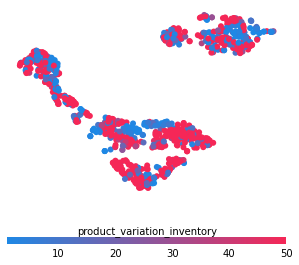

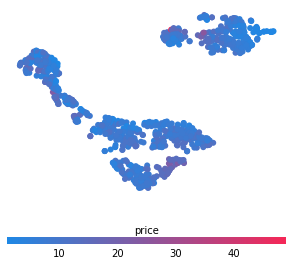

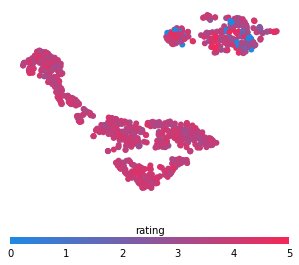

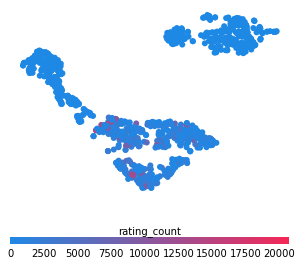

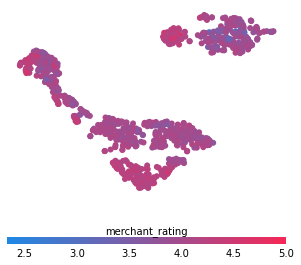

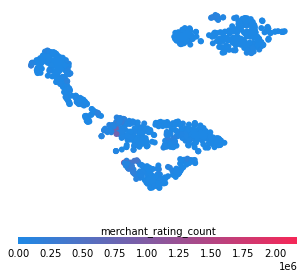

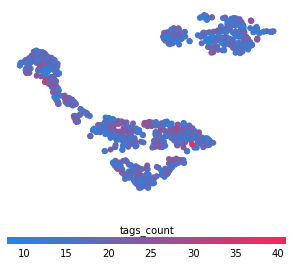

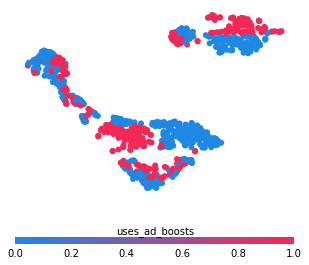

In [131]:
for feature in ["product_variation_inventory","price", "rating", "rating_count", "merchant_rating", 
                "merchant_rating_count", "tags_count", "uses_ad_boosts"]:
    f = pl.figure(figsize=(5,5))
    pl.scatter(shap_embedded[:,0],
               shap_embedded[:,1],
               c=X[feature].values[:1000].astype(np.float64),
               linewidth=0, alpha=1., cmap=red_blue_solid)
    cb = pl.colorbar(label=feature, aspect=40, orientation="horizontal")
    cb.set_alpha(1)
    cb.draw_all()
    cb.outline.set_linewidth(0)
    cb.ax.tick_params('x', length=0)
    cb.ax.xaxis.set_label_position('top')
    pl.gca().axis("off")
    pl.show()

## 3.2) As a Regression task

In [132]:
X = final.drop(['units_sold','success'], axis=1)
y = final['units_sold']

In [133]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=1)

We will start with a simple decision tree.

- Decision Tree

In [134]:
# create a regressor tree
tree_regressor = DecisionTreeRegressor(random_state = 0, max_depth=5) 
  
# fit 
tree_regressor.fit(X_train, y_train) 
y_pred = tree_regressor.predict(X_test)
#Computing RMSE
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Squared Error: 14511150.620072931
Root Mean Squared Error: 3809.3504197005727


Now's let's draw the decision tree graph to understand better our predictions:

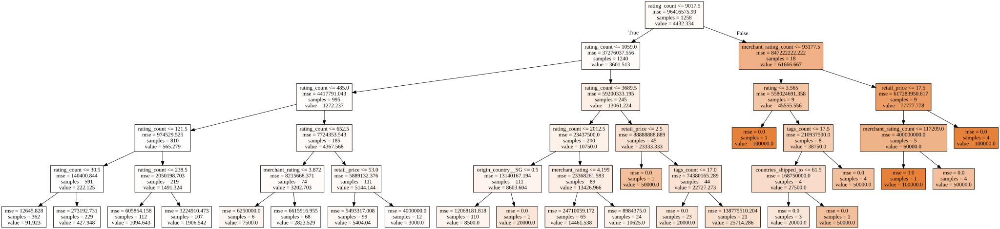

In [135]:
dot_data = tree.export_graphviz(tree_regressor, out_file=None, feature_names=X.columns, filled=True)
# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

We can clearly see how the Rating Count is the most important feature when dividing the tree into branches. The first division in the root node occurs for Rating Count <= 9017.5. After that, we also see some other important features, such as Rating, Merchant Rating Count, Tags Count, Retail Price, etc.

In [136]:
#Now let's do some Hyperparameter Tuning for the Decision Tree Regressor

pgrid = {"max_depth": [1, 2, 3, 4, 5, 6, 7, 10, 15, 20, 30, 50, 100],
      "min_samples_split": [2, 3, 5, 10, 15, 20]}

grid_search = GridSearchCV(DecisionTreeRegressor(), param_grid=pgrid, cv=10)
grid_search.fit(X_train, y_train)
best_tree = grid_search.best_estimator_
y_pred = best_tree.predict(X_test)

best_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
best_max_depth=grid_search.best_estimator_.max_depth
best_min_samples_split=grid_search.best_estimator_.min_samples_split
print('MRoot Mean Squared Error:', best_rmse)
print("best_max_depth ", best_max_depth)
print("best_min_samples_split ", best_min_samples_split)

MRoot Mean Squared Error: 3992.2505420026732
best_max_depth  6
best_min_samples_split  20


In [137]:
y_pred = best_tree.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, y_pred)))
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
ev = explained_variance_score(y_test, y_pred)


print("Performance on test set")
print('RMSE: {:.2f}'.format(rmse))
print('mean_absolute_error: {:.2f}'.format(mae))
print('median_absolute_error: {:.2f}'.format(mdae))
print('r2_score: {:.2f}'.format(r2))
print('explained_variance_score : {:.2f}'.format(ev))

Performance on test set
RMSE: 3992.25
mean_absolute_error: 1400.27
median_absolute_error: 309.28
r2_score: 0.69
explained_variance_score : 0.69


Now we will try an ensemble method, a random forest, to try to get a higher performance, and use SHAP to explain the predictions.

- Random Forest and SHAP

In [138]:
#Training using a Random Forest 
RF = RandomForestRegressor(random_state=10)
RF.fit(X_train, y_train)
y_pred = RF.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, y_pred)))
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
ev = explained_variance_score(y_test, y_pred)

print("Performance on test set")
print('RMSE: {:.2f}'.format(rmse))
print('mean_absolute_error: {:.2f}'.format(mae))
print('median_absolute_error: {:.2f}'.format(mdae))
print('r2_score: {:.2f}'.format(r2))
print('explained_variance_score : {:.2f}'.format(ev))

Performance on test set
RMSE: 2634.94
mean_absolute_error: 1161.07
median_absolute_error: 234.00
r2_score: 0.87
explained_variance_score : 0.87


In [139]:
#Let's see if we can improve this accuracy by using different Hyperparameters

# Number of trees in random forest
n_estimators = [100 , 200 , 300, 400]
# Number of features to consider at every split
max_features = ['auto', None]
# Maximum number of levels in tree
max_depth = [5,10,15,20,None]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
rfr = RandomForestRegressor(random_state=1)

rfr_random = RandomizedSearchCV(estimator = rfr, param_distributions = random_grid, n_iter = 100,cv = 2 ,  verbose=1, random_state=42, n_jobs = -1)
rfr_random.fit(X_train, y_train)


Fitting 2 folds for each of 100 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  1.1min finished


RandomizedSearchCV(cv=2, estimator=RandomForestRegressor(random_state=1),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'max_depth': [5, 10, 15, 20, None],
                                        'max_features': ['auto', None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400]},
                   random_state=42, verbose=1)

In [140]:
best_randomf = rfr_random.best_estimator_
y_pred = best_randomf.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, y_pred)))
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
ev = explained_variance_score(y_test, y_pred)


print("Performance on test set")
print('RMSE: {:.2f}'.format(rmse))
print('mean_absolute_error: {:.2f}'.format(mae))
print('median_absolute_error: {:.2f}'.format(mdae))
print('r2_score: {:.2f}'.format(r2))
print('explained_variance_score : {:.2f}'.format(ev))

Performance on test set
RMSE: 2618.42
mean_absolute_error: 1187.24
median_absolute_error: 266.13
r2_score: 0.87
explained_variance_score : 0.87


In the following graph, we can see the variable importance plot, that is, the list of the most significant variables in descending order. The top variables will contribute more to the model than the bottom ones. We clearly see how Rating Counts is the most relevant feature. Another important features are the Merchant Rating, the Merchant Rating Count, the Price, the Tags Count and the Uses Ad Boosts.

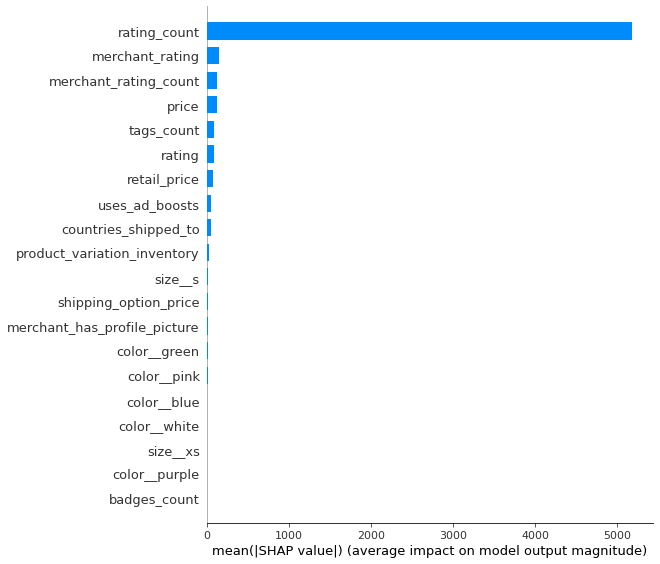

In [141]:
shap_values = shap.TreeExplainer(best_randomf).shap_values(X)
shap.summary_plot(shap_values, X, plot_type="bar")

In the following we can see a SHAP summary plot. This plot is made of all points in our dataset. From there we can see:
- The feature importance (variables ranked in descending order)
- The impact by looking at the horizontal position. That is, whether the effect of the value is associated with a higher or lower prediction.
- The color shows if the variable is high (red) or low (blue) for that observation.
- The correlation: for example, high values of Rating Count have a positive impact on the number of units sold (positively correlated).

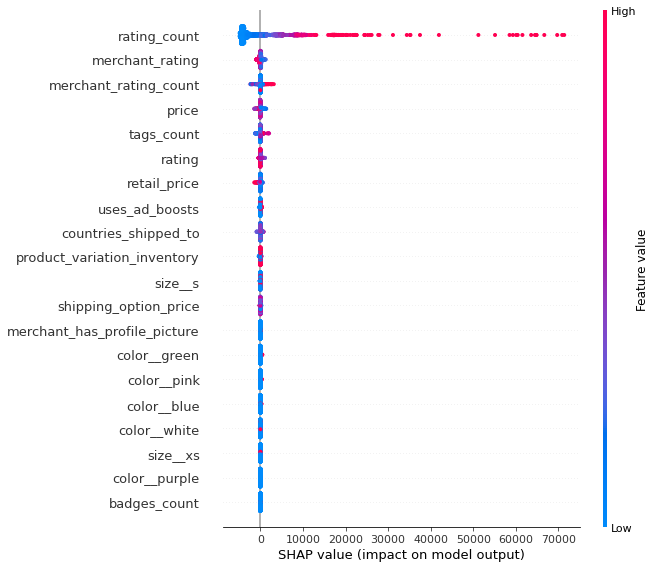

In [142]:
shap.summary_plot(shap_values, X)

In the following we can see some SHAP dependance plots. It basically shows the marginal effect one or two features have on the predicted outcome. It tells whether the relationship between the target and a feature is linear or more complex.
From there we can see, for example, an approximately linear and positive relationship between the Rating Count and the target variable (number of units sold), and see that the Rating Count interacts frequently with the Price.

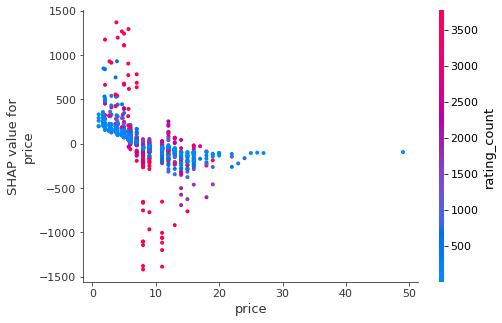

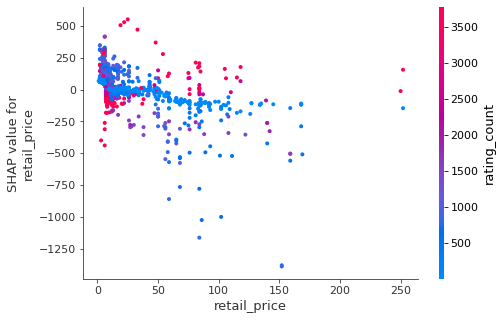

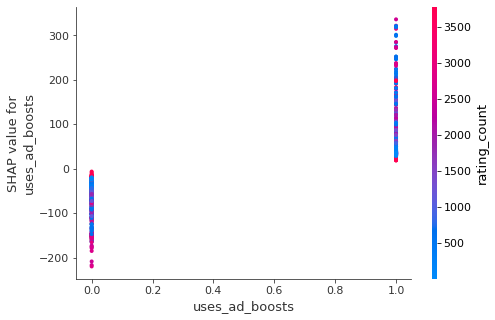

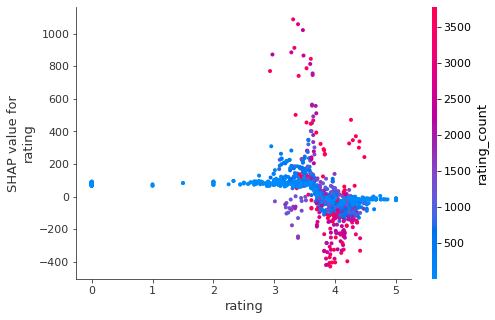

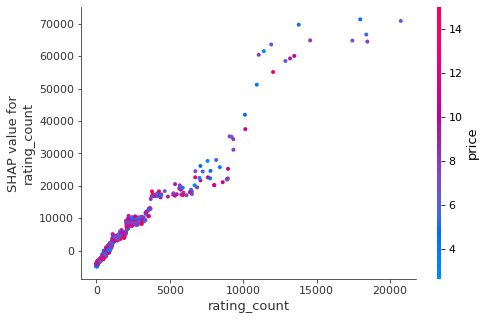

...

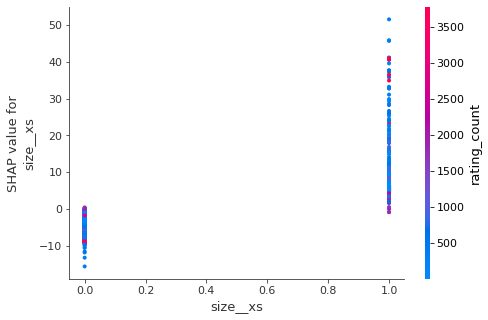

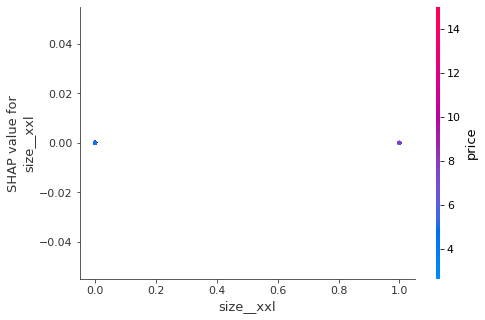

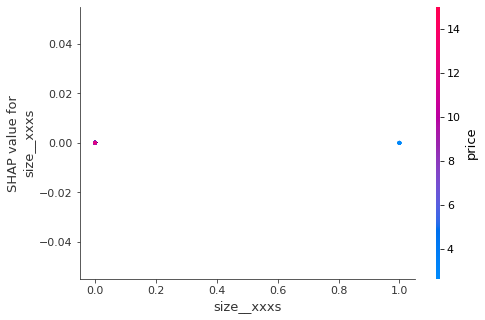

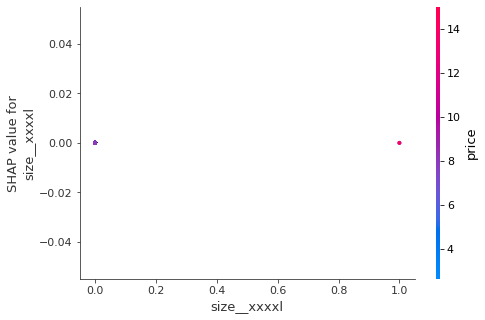

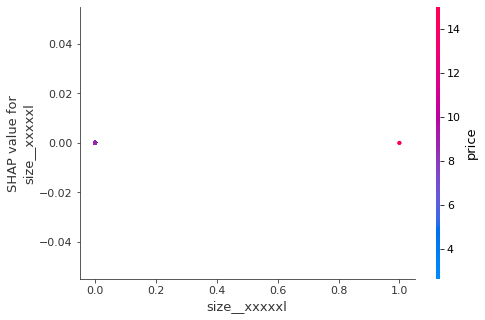

In [143]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X, display_features=X)

Next we will do some local interpretability (Individual SHAP Value Plots). We identify the following elements:

- Output value: the prediction (number of units sold) for the observation.
- Base value: the value that would be predicted if we did not know any features for the current output (the mean prediction).
- Colors Red/Blue: red for features that push the prediction higher (to the right), blue for those that push the prediction lower.

In [144]:
explainer = shap.TreeExplainer(best_randomf)
shap_values = explainer.shap_values(X_test)

In [145]:
shap.force_plot(explainer.expected_value, shap_values[9,:], X_test.iloc[9,:])

We know that the Rating Count has a positive impact on the prediction, therefore a value much lower than the mean will push the prediction to the left.

In [146]:
shap.force_plot(explainer.expected_value, shap_values[11,:], X_test.iloc[11,:])

We know that the Rating Count has a positive impact on the prediction, therefore a value much higher than the mean will push the prediction to the right.

In [147]:
shap.force_plot(explainer.expected_value, shap_values[14,:], X_test.iloc[14,:])

We know that the Rating Count has a positive impact on the prediction, therefore a value much lower than the mean will push the prediction to the left. In this case, we also have a small value for price, and we know that the price has a negative impact on the prediction, therefore it accounts for a push to the right, but its magnitude is much smaller than that of the push to right by the Rating Count.

In [148]:
shap.force_plot(explainer.expected_value, shap_values[12,:], X_test.iloc[12,:])

Similar as the last case, here we have a push to the left by the Rating Count due to its small value, and a small push to the right due to the high value of the Merchant Rating Count. At the end the magnitude of the Rating Count prevails and we have a final prediction very much to the left (348.26).

In [149]:
shap.force_plot(explainer.expected_value, shap_values[18,:], X_test.iloc[18,:])

For this last case, we can see how a high value of Rating Count is not enough to make the push to the right greater than the push to left. This is because we have many other important features making a push to the left, such as the low value of the Merchant Rating Count or the fact that the Uses Ad Boosts is set to 0.

# 4. Conclusion

We have used several methods and algorithms to predict and explain a single problem. Each one of them brings interesting and supplementary insights, and they strengthen each other. We tackled the problem as two different tasks, as a classification problem and as a regression one. For each case, we were able to apply many explainable techniques and found that the most important features hold the same for both cases ('rating_count', 'merchant_rating', 'merchant_rating_count', 'tags_count', 'price', 'uses_ad_boosts'), being the Rating Count the most important one, that is, the number of ratings the product listing has. This result makes sense because it is clear that the more ratings a product has, the more views it has, the more chances it has to be bought, and therefore, the more successful it can be. Additionally, we were able to achieve high performances for both, the classification and the regression case, by using ensemble machine learning algorithms and proved that performance and explainability are not mutually-exclusive.

## THE END